## TFG MANEL

### Petita exploració de wordnet, com funciona, com es relaciona, com es l'estructura jerarquica.

1. Importació de llibreries

In [1]:
import nltk
from nltk.corpus import wordnet as wn
import networkx as nx
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import os
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt

#### Arbre del wordnet
- Es tracta d'un DAG, graf dirigit aciclic. No hi ha un camí que comenci i acabi en el mateix lloc

#### L'estructura del wordnet es basa en synsets

- Synset = Conjunt de sinònims representats per un d'ells, que té un significat únic. (Unitat Base de wordnet/imagenet)
- Un node recopila tots els sinònims d'aquella paraula dintre del mateix context, dog --> gos, dog --> perrito caliente, difs contexts
-  Cada node de l'arbre és un synset que es relaciona amb altres synsets en forma d'hiponims o hyperonims

#### L'estructura del synsets
- Cada sysnset es representa com : ParaulaClau.TipusParaula.Significat.
- Paraula Base : Paraula que reciopila tota la informació, tots el sinonims. Paraula Representativa
- Tipus de Paraula : Noun, Verb, Adjective, Adverb, etc
- Significat :Numero que identifica els diferents significats d'una paraula que s'escriu igual (paraules homonimes)
ex: dog i dog dog.n.01 = gos, dog.n.02 = perrito caliente

#### Informació dintre del synset
- Nom
- Definició
- Exemples
- Sinònims

#### Hyperonims i Hyponims
- Hyperonims: Són les paraules que tenen un significat més general 
- Hyponims: Són les paraules que tenen un significat més específic
ex: Animal --> gos, gat, etc. (Animal es un hyperonim de gos)
- Per a navegar per l'arbre anirem escalant per hyperonims fins a trobar el hyperonim general per a les paraules

#### Meronyms i Holonims
- Meronyms: Parts d'un concepte , ex : Cotxe --> Roda
- Holonims: Conceptes que estan compostos per meronyms, ex : Roda --> Cotxe

#### Objetivo: 
- Encontrar aquel concepto general que relacione los difernetes top scores de cada una de las neuronas de una capa

#### LCA: Least Common Ancestor
- Conjunto mas general para el conjunto de etiquetas

## COMENÇA L'EXPLORACIÓ

Print de la informació d'un sysnset

In [2]:
dog = wn.synset('dalmatian.n.02')
print("Nombre del Synset:", dog.name())
print("Definición:", dog.definition())
print("Ejemplos de uso:", dog.examples())
print("Sinónimos:", dog.lemma_names())

Nombre del Synset: dalmatian.n.02
Definición: a large breed having a smooth white coat with black or brown spots; originated in Dalmatia
Ejemplos de uso: []
Sinónimos: ['dalmatian', 'coach_dog', 'carriage_dog']


Hypernims i hyponims

In [3]:
hypernyms = dog.hypernyms()
print("Hypernyms :", [h.name() for h in hypernyms])
hyponyms = dog.hyponyms()
print("Hyponyms :", [h.name() for h in hyponyms]) 

Hypernyms : ['dog.n.01']
Hyponyms : ['liver-spotted_dalmatian.n.01']


LCA de dos exemples: gat i gos

In [4]:
# Synsets de "dog" y "cat"
dog = wn.synset('dog.n.01')
cat = wn.synset('cat.n.01')
lca = dog.lowest_common_hypernyms(cat)
print("Lowest Common Ancestor:", lca[0].name(), "-", lca[0].definition())


Lowest Common Ancestor: carnivore.n.01 - a terrestrial or aquatic flesh-eating mammal


Obtenir tot el camí, amb la descripció de cada pas

In [5]:
dog_paths = dog.hypernym_paths()
cat_paths = cat.hypernym_paths()

# Imprimir rutas
print("Ruta de 'dog.n.01':")
for synset in dog_paths[0]:
    print(f"  {synset.name()} - {synset.definition()}")

print("\nRuta de 'cat.n.01':")
for synset in cat_paths[0]:
    print(f"  {synset.name()} - {synset.definition()}")


Ruta de 'dog.n.01':
  entity.n.01 - that which is perceived or known or inferred to have its own distinct existence (living or nonliving)
  physical_entity.n.01 - an entity that has physical existence
  object.n.01 - a tangible and visible entity; an entity that can cast a shadow
  whole.n.02 - an assemblage of parts that is regarded as a single entity
  living_thing.n.01 - a living (or once living) entity
  organism.n.01 - a living thing that has (or can develop) the ability to act or function independently
  animal.n.01 - a living organism characterized by voluntary movement
  chordate.n.01 - any animal of the phylum Chordata having a notochord or spinal column
  vertebrate.n.01 - animals having a bony or cartilaginous skeleton with a segmented spinal column and a large brain enclosed in a skull or cranium
  mammal.n.01 - any warm-blooded vertebrate having the skin more or less covered with hair; young are born alive except for the small subclass of monotremes and nourished with milk

In [6]:
# Llistar tots els Synsets de "dog"
dog_synsets = wn.synsets('dog')
for synset in dog_synsets:
    print(f"{synset.name()} - {synset.definition()}")


dog.n.01 - a member of the genus Canis (probably descended from the common wolf) that has been domesticated by man since prehistoric times; occurs in many breeds
frump.n.01 - a dull unattractive unpleasant girl or woman
dog.n.03 - informal term for a man
cad.n.01 - someone who is morally reprehensible
frank.n.02 - a smooth-textured sausage of minced beef or pork usually smoked; often served on a bread roll
pawl.n.01 - a hinged catch that fits into a notch of a ratchet to move a wheel forward or prevent it from moving backward
andiron.n.01 - metal supports for logs in a fireplace
chase.v.01 - go after with the intent to catch


Graf per a visualitzar el cami

OJO: Hi ha diferents camins possibles per a un mateix synset, més d'un hypernim per paraula

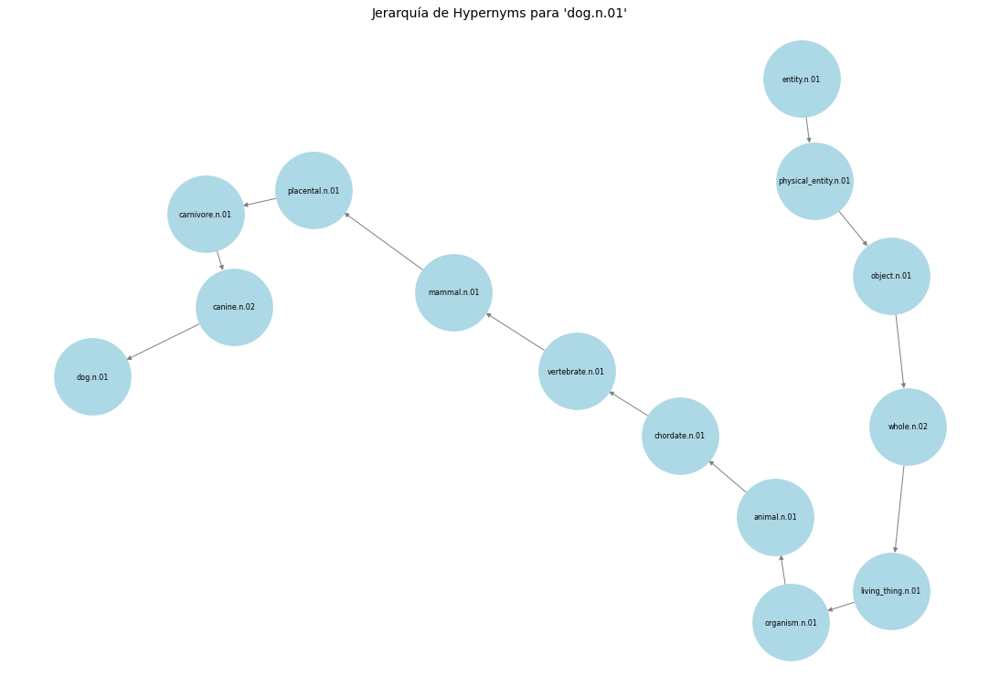

In [7]:

G = nx.DiGraph()
for synset in dog.hypernym_paths()[0]:
    G.add_node(synset.name(), label=synset.name())
    if synset.hypernyms():
        G.add_edge(synset.hypernyms()[0].name(), synset.name())
plt.figure(figsize=(15, 10))  # Aumentar el tamaño de la figura
pos = nx.spring_layout(G, seed=42)  # Distribución más clara
nx.draw(
    G,
    pos,
    with_labels=False,
    node_size=7000,
    node_color="lightblue",
    edge_color="gray",
    font_size=10,
)
labels = nx.get_node_attributes(G, 'label')
nx.draw_networkx_labels(G, pos, labels=labels, font_size=8, verticalalignment='center')

plt.title("Jerarquía de Hypernyms para 'dog.n.01'", fontsize=14)
plt.show()



Exemple més extens amb animals

In [8]:
image_labels = ['golden_retriever', 'beagle', 'labrador_retriever', 'wolf', 
                'fox', 'cat', 'lion', 'tiger', 'cheetah', 'dog']
synsets = [wn.synsets(label, pos=wn.NOUN)[0] for label in image_labels]
for synset in synsets:
    print(f"Etiqueta: {synset.name()} - {synset.definition()}")

Etiqueta: golden_retriever.n.01 - an English breed having a long silky golden coat
Etiqueta: beagle.n.01 - a small short-legged smooth-coated breed of hound
Etiqueta: labrador_retriever.n.01 - breed originally from Labrador having a short black or golden-brown coat
Etiqueta: wolf.n.01 - any of various predatory carnivorous canine mammals of North America and Eurasia that usually hunt in packs
Etiqueta: fox.n.01 - alert carnivorous mammal with pointed muzzle and ears and a bushy tail; most are predators that do not hunt in packs
Etiqueta: cat.n.01 - feline mammal usually having thick soft fur and no ability to roar: domestic cats; wildcats
Etiqueta: lion.n.01 - large gregarious predatory feline of Africa and India having a tawny coat with a shaggy mane in the male
Etiqueta: tiger.n.01 - a fierce or audacious person
Etiqueta: cheetah.n.01 - long-legged spotted cat of Africa and southwestern Asia having nonretractile claws; the swiftest mammal; can be trained to run down game
Etiqueta: do

In [9]:
common_ancestor = synsets[0] 
for synset in synsets[1:]:
    common_ancestor = common_ancestor.lowest_common_hypernyms(synset)[0]
print("Ancestro común más cercano:")
print(f"  {common_ancestor.name()} - {common_ancestor.definition()}")

Ancestro común más cercano:
  organism.n.01 - a living thing that has (or can develop) the ability to act or function independently


In [10]:
hypernym_path = common_ancestor.hypernym_paths()[0]
print("Ruta fins arrel")
for hypernym in hypernym_path:
    print(f"  {hypernym.name()} - {hypernym.definition()}")

Ruta fins arrel
  entity.n.01 - that which is perceived or known or inferred to have its own distinct existence (living or nonliving)
  physical_entity.n.01 - an entity that has physical existence
  object.n.01 - a tangible and visible entity; an entity that can cast a shadow
  whole.n.02 - an assemblage of parts that is regarded as a single entity
  living_thing.n.01 - a living (or once living) entity
  organism.n.01 - a living thing that has (or can develop) the ability to act or function independently


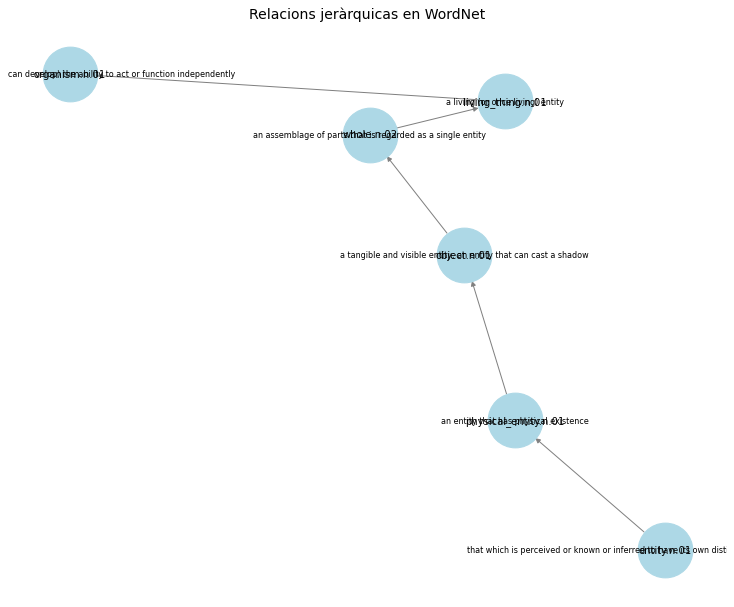

In [11]:
G = nx.DiGraph()
for synset in hypernym_path:
    G.add_node(synset.name(), label=synset.definition())
    if synset.hypernyms():
        G.add_edge(synset.hypernyms()[0].name(), synset.name())
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, with_labels=True, node_size=3000, node_color="lightblue", edge_color="gray", font_size=10)
labels = nx.get_node_attributes(G, 'label')
nx.draw_networkx_labels(G, pos, labels=labels, font_size=8, verticalalignment='center')

plt.title("Relacions jeràrquicas en WordNet", fontsize=14)
plt.show()


## Similaritats entre les definicions

In [12]:
# Definiciones de los Synsets
definitions = [synset.definition() for synset in synsets]

# Calcular vectores TF-IDF
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(definitions)

# Calcular similitud coseno entre las definiciones
similarity_matrix = cosine_similarity(tfidf_matrix)
print("Matriz de similitud:")
print(similarity_matrix)


Matriz de similitud:
[[1.         0.09032877 0.31070855 0.         0.         0.04116789
  0.1054667  0.         0.10414647 0.        ]
 [0.09032877 1.         0.17519629 0.07654285 0.         0.
  0.03958876 0.         0.10041574 0.02964475]
 [0.31070855 0.17519629 1.         0.         0.         0.03461853
  0.08868811 0.12962067 0.02872    0.05298597]
 [0.         0.07654285 0.         1.         0.25748113 0.08343271
  0.17162625 0.         0.06809628 0.09825884]
 [0.         0.         0.         0.25748113 1.         0.08697805
  0.1285766  0.         0.07215818 0.05112363]
 [0.04116789 0.         0.03461853 0.08343271 0.08697805 1.
  0.11460694 0.         0.13225882 0.        ]
 [0.1054667  0.03958876 0.08868811 0.17162625 0.1285766  0.11460694
  1.         0.         0.15539098 0.11366035]
 [0.         0.         0.12962067 0.         0.         0.
  0.         1.         0.         0.        ]
 [0.10414647 0.10041574 0.02872    0.06809628 0.07215818 0.13225882
  0.15539098 0.

# INICI DE TFG

## TASCA 1

- Ens ve la informació per carpetes:
    - 1 Llistes TFG
        - 2 Capes
            - 3 Neurones de cada capa
                - 4 Top 100 imatges de cada una de les neurones

Llegir la informació de les llistes que ens han donat i crar un mapping per a poder tindre en forma de classe de imagenet per a poder fer una posterior cerca

Definiré diferntes funcions:
- 1 Llegir els documents
- 2 Crear el mapping
- 3 Crear nou document amb els synsets de l'imagenet

## Pas 1: Càrrega de les dades de les capes

En aquest pas, carregarem els arxius `.npy` que contenen les dades de les diferents capes de la xarxa neuronal. 
Cada capa conté una matriu on cada fila representa una neurona i les seves imatges associades.

### **Objectiu**
- Llegir els arxius `.npy` de les diferents capes (`relu`, `layer1`, `layer2`, `layer3`).
- Organitzar les dades en un diccionari per accedir-hi fàcilment.
- Verificar la mida de cada capa després de carregar-les.


1.Leer los archivos guardado en formado array

In [13]:
def load_data(base_path, layers):
    data = {}
    for layer in layers:
        file_path = os.path.join(base_path, f"{layer}.npy")
        if os.path.exists(file_path):
            data[layer] = np.load(file_path, allow_pickle=True)
            print(f"Load {layer} - Shape: {data[layer].shape}")
        else:
            print(f"Not found {file_path}")
    return data
base_path = "../Data/" 
layers = ["relu", "layer1", "layer2", "layer3"]

data = load_data(base_path, layers)

Load relu - Shape: (64, 100)
Load layer1 - Shape: (256, 100)
Load layer2 - Shape: (512, 100)
Load layer3 - Shape: (1024, 100)


## Pas 2

1. Funció per a converir un wnid a un synset

In [14]:
def wnid_a_synset(wnid):
    """
    Converteix un WNID d'ImageNet a un synset de WordNet utilitzant NLTK.

    Paràmetres:
    - wnid: str, identificador WNID d'ImageNet (exemple: 'n02119789').

    Retorna:
    - Synset de WordNet si existeix, altrament None.
    """
    try:
        synset = wn.synset_from_pos_and_offset('n', int(wnid[1:]))  # Convertim el codi WNID en un synset
        return synset
    except:
        return None

# Prova amb exemple
wnid_exemple = "n02119789"  # Kit fox
synset = wnid_a_synset(wnid_exemple)

if synset:
    print(f"WNID: {wnid_exemple}")
    print(f"Synset: {synset}")
    print(f"Definició: {synset.definition()}")
    print(f"Sinònims: {synset.lemma_names()}")
else:
    print(f"No s'ha trobat un synset per {wnid_exemple}")

WNID: n02119789
Synset: Synset('kit_fox.n.01')
Definició: small grey fox of southwestern United States; may be a subspecies of Vulpes velox
Sinònims: ['kit_fox', 'Vulpes_macrotis']


2. Funcio per a mapeig manual tot i que tenim llibreries nltk

In [15]:
def carregar_mapeig_wnid(ruta_fitxer):
    """
    Carrega el fitxer `Image_net_Classes.txt` i construeix un diccionari {WNID: nom_classe}.

    Paràmetres:
    - ruta_fitxer: str, ruta de l'arxiu.

    Retorna:
    - Diccionari {WNID: nom_classe}.
    """
    mapeig = {}
    with open(ruta_fitxer, "r") as f:
        for linia in f:
            parts = linia.strip().split(": ")  # Format: "nxxxxx: nom_classe"
            if len(parts) == 2:
                wnid, nom_classe = parts
                mapeig[wnid] = nom_classe
    return mapeig

ruta_mapeig = "../Data/Image_net_Classes.txt"  # Ajusta la ruta si cal
mapeig_wnids_manual = carregar_mapeig_wnid(ruta_mapeig)
list(mapeig_wnids_manual.items())[:5]

[('n02119789', 'kit fox, Vulpes macrotis'),
 ('n02100735', 'English setter'),
 ('n02096294', 'Australian terrier'),
 ('n02066245',
  'grey whale, gray whale, devilfish, Eschrichtius gibbosus, Eschrichtius robustus'),
 ('n02509815',
  'lesser panda, red panda, panda, bear cat, cat bear, Ailurus fulgens')]

3. Funció de traspas / mapping

In [16]:
def obtenir_synset(wnid, mapeig_manual):
    """
    Intenta obtenir la informació d'un WNID utilitzant WordNet i, si no funciona, usa el mapeig manual.

    Paràmetres:
    - wnid: str, identificador WNID d'ImageNet.
    - mapeig_manual: dict, diccionari {WNID: nom_classe} carregat de `Image_net_Classes.txt`.

    Retorna:
    - Tuple (synset, definició, sinònims).
    """
    synset = wnid_a_synset(wnid)
    if synset:
        return synset, synset.definition(), synset.lemma_names()
    elif wnid in mapeig_manual:
        return None, f"Nom a ImageNet: {mapeig_manual[wnid]}", []
    else:
        return None, "Sense informació", []

# Provar amb un exemple
wnid_exemple = "n02119789"  # Kit fox
resultat = obtenir_synset(wnid_exemple, mapeig_wnids_manual)

print(f"WNID: {wnid_exemple}")
print(f"Synset: {resultat[0]}")
print(f"Descripció: {resultat[1]}")
print(f"Sinònims: {resultat[2]}")


WNID: n02119789
Synset: Synset('kit_fox.n.01')
Descripció: small grey fox of southwestern United States; may be a subspecies of Vulpes velox
Sinònims: ['kit_fox', 'Vulpes_macrotis']


4. Traspàs complet

In [17]:
import re
from collections import Counter

def processar_i_convertir_synsets(dades_capas, mapeig_manual, top_n=5):
    """
    Processa les capes de la xarxa neuronal per obtenir els synsets associats a cada neurona.
    - Converteix tots els WNIDs a objectes Synset (NO només els top_k).
    - Genera estadístiques sobre els WNIDs més activadors.

    Paràmetres:
    - dades_capas: dict, diccionari original amb capes i activacions per neurona.
    - mapeig_manual: dict, diccionari {WNID: nom_classe} carregat de `Image_net_Classes.txt`.
    - top_n: int, nombre de WNIDs més activadors a mostrar per cada neurona (només per imprimir).

    Retorna:
    - Un diccionari amb la mateixa estructura que `dades_capas`, però amb objectes Synset (tots, no només els top_k).
    - Estadístiques de conversió i activació.
    """
    dades_synsets = {}
    estadistiques = {}

    for capa, activacions in dades_capas.items():
        dades_synsets[capa] = []  # Inicialitzem la capa
        estadistiques[capa] = {}

        print(f"\n====== Processant capa: {capa} ({len(activacions)} neurones) ======")

        for neuron_idx, row in enumerate(activacions):
            wnids = [path.split('/')[0] for path in row]  # Extreure WNIDs
            wnids_counter = Counter(wnids)  # Comptar repeticions de cada WNID

            # Convertir TOTS els WNIDs a synsets
            synsets_info = [(wnid, obtenir_synset(wnid, mapeig_manual)[0]) for wnid in wnids]
            synsets_valids = [synset for wnid, synset in synsets_info if synset]  # Filtrar els None

            # Guardar TOTS els synsets per a aquesta neurona
            dades_synsets[capa].append(synsets_valids)

            # Obtenir només les top-k més freqüents per imprimir mètriques
            wnids_most_common = wnids_counter.most_common(top_n)
            top_synsets = [(wnid, obtenir_synset(wnid, mapeig_manual)[0], freq) for wnid, freq in wnids_most_common]
            top_synsets_valids = [(wnid, synset, freq) for wnid, synset, freq in top_synsets if synset]

            # Estadístiques
            total_wnids = sum(wnids_counter.values())
            wnids_unics = len(wnids_counter)
            wnids_valids = len(synsets_valids)
            ratio_conversion = (wnids_valids / len(wnids)) * 100 if wnids else 0
            mitjana_sinonims = sum(len(synset.lemma_names()) for synset in synsets_valids) / wnids_valids if wnids_valids else 0

            # Guardar estadístiques
            estadistiques[capa][f"neuron_{neuron_idx}"] = {
                "total_imatges": total_wnids,
                "total_WNIDs_diferents": wnids_unics,
                "WNIDs_convertits": wnids_valids,
                "ratio_conversion": ratio_conversion,
                "mitjana_sinonims": mitjana_sinonims,
                "top_WNIDs": {wnid: freq for wnid, _, freq in top_synsets_valids}
            }

            # Imprimir mètriques per neurona
            print(f"\nNeurona {neuron_idx}:")
            print(f"  - Total imatges processades: {total_wnids}")
            print(f"  - Total WNIDs diferents: {wnids_unics}")
            print(f"  - WNIDs convertits correctament: {wnids_valids}")
            print(f"  - Ràtio de conversió: {ratio_conversion:.2f}%")
            print(f"  - Mitjana de sinònims per synset: {mitjana_sinonims:.2f}")
            print(f"  - Principals WNIDs que activen la neurona:")
            for wnid, synset, freq in top_synsets_valids:
                print(f"    - {synset}: {synset.definition()} (Freqüència: {freq})")

    return dades_synsets, estadistiques

In [18]:
# Executar la conversió i processament
dades_synsets, stats = processar_i_convertir_synsets(data, mapeig_wnids_manual)

# Veure dades transformades (Synsets de les primeres 2 neurones de 'relu')
for i, synsets in enumerate(dades_synsets["relu"][:2]):
    print(f"\nNeurona {i}:")
    for synset in synsets[:5]:  # Mostrem només els 5 primers per no imprimir massa
        print(f"  - {synset} -> {synset.definition()} (sinònims: {synset.lemma_names()})")

# Veure estadístiques d'una capa
import json
print(json.dumps(stats["relu"], indent=4, ensure_ascii=False))



====== Processant capa: relu (64 neurones) ======

Neurona 0:
  - Total imatges processades: 100
  - Total WNIDs diferents: 74
  - WNIDs convertits correctament: 100
  - Ràtio de conversió: 100.00%
  - Mitjana de sinònims per synset: 1.56
  - Principals WNIDs que activen la neurona:
    - Synset('zebra.n.01'): any of several fleet black-and-white striped African equines (Freqüència: 18)
    - Synset('buckle.n.01'): fastener that fastens together two ends of a belt or strap; often has loose prong (Freqüència: 3)
    - Synset('typewriter_keyboard.n.01'): a keyboard for manually entering characters to be printed (Freqüència: 2)
    - Synset('cardoon.n.02'): only parts eaten are roots and especially stalks (blanched and used as celery); related to artichokes (Freqüència: 2)
    - Synset('suspension_bridge.n.01'): a bridge that has a roadway supported by cables that are anchored at both ends (Freqüència: 2)

Neurona 1:
  - Total imatges processades: 100
  - Total WNIDs diferents: 75
  - WN

In [19]:
dades_synsets

{'relu': [[Synset('breastplate.n.01'),
   Synset('typewriter_keyboard.n.01'),
   Synset('analog_clock.n.01'),
   Synset('minibus.n.01'),
   Synset('cardoon.n.02'),
   Synset('space_shuttle.n.01'),
   Synset('ocarina.n.01'),
   Synset('whiptail.n.01'),
   Synset('limousine.n.01'),
   Synset('zebra.n.01'),
   Synset('bobsled.n.02'),
   Synset('miniskirt.n.01'),
   Synset('suspension_bridge.n.01'),
   Synset('goose.n.01'),
   Synset('long-horned_beetle.n.01'),
   Synset('boathouse.n.01'),
   Synset('zebra.n.01'),
   Synset('tape_player.n.01'),
   Synset('yawl.n.01'),
   Synset('buckle.n.01'),
   Synset('lawn_mower.n.01'),
   Synset('shovel.n.01'),
   Synset('window_shade.n.01'),
   Synset('zebra.n.01'),
   Synset('beach_wagon.n.01'),
   Synset('consomme.n.01'),
   Synset('night_snake.n.01'),
   Synset('gondola.n.02'),
   Synset('loupe.n.01'),
   Synset('cassette_player.n.01'),
   Synset('spider_web.n.01'),
   Synset('hoopskirt.n.01'),
   Synset('zebra.n.01'),
   Synset('buckle.n.01'),
   

Funció Main per a poder processar totes les capes alhora i crear un json amb els synsets que hem mapejat

## Funció d'anàlisis

## 1. Funció semblant a l'anterior pero per una capa només

In [ ]:
def veure_classes_més_repetides(capa, dades_capas, mapeig_manual, top_n=5):
    """
    Mostra les classes d'ImageNet més repetides per cada neurona en una capa donada.

    Paràmetres:
    - capa: str, nom de la capa ('relu', 'layer1', etc.).
    - dades_capas: dict, diccionari amb les dades processades (synsets per neurona).
    - mapeig_manual: dict, mapeig {WNID: nom_classe} carregat de `Image_net_Classes.txt`.
    - top_n: int, nombre de classes més freqüents a mostrar per cada neurona.

    Retorna:
    - Diccionari {neurona: [(classe, definició, freqüència)]} amb les classes més activadores.
    """
    if capa not in dades_capas:
        print(f"La capa '{capa}' no existeix.")
        return {}

    print(f"\n====== Anàlisi de les classes més repetides a la capa: {capa} ======")

    resultats = {}
    
    for neuron_idx, synsets in enumerate(dades_capas[capa]):
        # Contar la frecuencia de cada clas
        synset_counter = Counter(synsets)
        synset_most_common = synset_counter.most_common(top_n)

        # Guardar informació de les classes més repetides
        resultats[f"neuron_{neuron_idx}"] = [
            (synset.name(), synset.definition(), freq)
            for synset, freq in synset_most_common
        ]

        # Imprimir resultats per a cada neurona
        print(f"\nNeurona {neuron_idx}:")
        for synset, freq in synset_most_common:
            print(f"  - {synset.name()} ({freq} vegades) -> {synset.definition()}")

    return resultats

In [ ]:
resultats_classes = veure_classes_més_repetides("layer3", dades_synsets, mapeig_wnids_manual)
# Veure les classes més repetides d'una neurona concreta
import json
print(json.dumps(resultats_classes["neuron_0"], indent=4, ensure_ascii=False))


====== Anàlisi de les classes més repetides a la capa: layer3 ======

Neurona 0:
  - bottlecap.n.01 (2 vegades) -> a cap that seals a bottle
  - hotdog.n.02 (2 vegades) -> a frankfurter served hot on a bun
  - acorn_squash.n.02 (2 vegades) -> small dark green or yellow ribbed squash with yellow to orange flesh
  - ladybug.n.01 (2 vegades) -> small round bright-colored and spotted beetle that usually feeds on aphids and other insect pests
  - packet.n.03 (2 vegades) -> a small package or bundle

Neurona 1:
  - oystercatcher.n.01 (10 vegades) -> black-and-white shorebird with stout legs and bill; feed on oysters etc.
  - coucal.n.01 (9 vegades) -> Old World ground-living cuckoo having a long dagger-like hind claw
  - guinea_pig.n.02 (8 vegades) -> stout-bodied nearly tailless domesticated cavy; often kept as a pet and widely used in research
  - angora.n.03 (8 vegades) -> domestic breed of rabbit with long white silky hair
  - spoonbill.n.01 (4 vegades) -> wading birds having a long fla

## ESTRATEGIES DE CERCA

## Cerca del concepte predominant

##### 1. LCA (lowest conmmon ancestor)

In [ ]:
def trobar_LCA_synsets(synsets):
    """
    Troba l'ancestre comú més baix (LCA) d'una llista de synsets en WordNet.

    Paràmetres:
    - synsets: Llista de synsets de WordNet.

    Retorna:
    - Synset que representa l'hiperònim més específic compartit per tots.
    """
    if not synsets:
        return None

    # Obtenir la llista de tots els camins fins a la arrel per cada synset
    camins = [set(s.closure(lambda s: s.hypernyms())) for s in synsets]

    # Trobar la intersecció més profunda entre tots els camins
    interseccio = set.intersection(*camins)

    if interseccio:
        # Seleccionar el synset més profund (més específic)
        return max(interseccio, key=lambda s: len(list(s.closure(lambda s: s.hypernyms()))))

    return None  # Si no hi ha un ancestre comú

def processar_LCA_per_capa(dades_synsets):
    """
    Processa cada capa i cada neurona trobant el LCA dels synsets activats.

    Paràmetres:
    - dades_synsets: Diccionari {capa: llista de neurones}, on cada neurona és una llista de synsets.

    Retorna:
    - Diccionari amb el concepte predominant (LCA) per cada neurona.
    """
    resultats_LCA = {}

    for capa, neurones in dades_synsets.items():
        print(f"\n====== Processant capa: {capa} ======")
        resultats_LCA[capa] = {}

        for neuron_idx, synsets in enumerate(neurones):
            lca = trobar_LCA_synsets(synsets)

            if lca:
                concepte = lca.lemmas()[0].name()
            else:
                concepte = "Sense informació"

            resultats_LCA[capa][f"neuron_{neuron_idx}"] = concepte

            print(f"\ Neurona {neuron_idx}")
            print(f" - Concepte predominant (LCA): {concepte}")

    return resultats_LCA

resultats_LCA = processar_LCA_per_capa(dades_synsets)



====== Processant capa: relu ======

🔹 Neurona 0
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 1
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 2
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 3
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 4
  - Concepte predominant (LCA): entity

🔹 Neurona 5
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 6
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 7
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 8
  - Concepte predominant (LCA): whole

🔹 Neurona 9
  - Concepte predominant (LCA): whole

🔹 Neurona 10
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 11
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 12
  - Concepte predominant (LCA): entity

🔹 Neurona 13
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 14
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 15
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 16
  - C

c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentalit


  - Concepte predominant (LCA): physical_entity

🔹 Neurona 43
  - Concepte predominant (LCA): entity

🔹 Neurona 44
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 45
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 46
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 47
  - Concepte predominant (LCA): whole

🔹 Neurona 48
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 49
  - Concepte predominant (LCA): entity

🔹 Neurona 50
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 51
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 52
  - Concepte predominant (LCA): entity

🔹 Neurona 53
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 54
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 55
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 56
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 57
  - Concepte predominant (LCA): entity

🔹 Neurona 58
  - Concepte predominant (LCA): entity

🔹 Neurona 59


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):



  - Concepte predominant (LCA): entity

🔹 Neurona 41
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 42
  - Concepte predominant (LCA): entity

🔹 Neurona 43
  - Concepte predominant (LCA): entity

🔹 Neurona 44
  - Concepte predominant (LCA): entity

🔹 Neurona 45
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 46
  - Concepte predominant (LCA): entity

🔹 Neurona 47
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 48
  - Concepte predominant (LCA): entity

🔹 Neurona 49
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 50
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 51
  - Concepte predominant (LCA): entity

🔹 Neurona 52
  - Concepte predominant (LCA): entity

🔹 Neurona 53
  - Concepte predominant (LCA): entity

🔹 Neurona 54
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 55
  - Concepte predominant (LCA): entity

🔹 Neurona 56
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 57
  - Concepte predominant (LCA): ent

c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):



  - Concepte predominant (LCA): entity

🔹 Neurona 94
  - Concepte predominant (LCA): entity

🔹 Neurona 95
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 96
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 97
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 98
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 99
  - Concepte predominant (LCA): entity

🔹 Neurona 100
  - Concepte predominant (LCA): entity

🔹 Neurona 101
  - Concepte predominant (LCA): entity

🔹 Neurona 102
  - Concepte predominant (LCA): entity

🔹 Neurona 103
  - Concepte predominant (LCA): entity

🔹 Neurona 104
  - Concepte predominant (LCA): entity

🔹 Neurona 105
  - Concepte predominant (LCA): physical_entity

🔹 Neurona 106
  - Concepte predominant (LCA): entity

🔹 Neurona 107
  - Concepte predominant (LCA): entity

🔹 Neurona 108
  - Concepte predominant (LCA): entity

🔹 Neurona 109
  - Concepte predominant (LCA): entity

🔹 Neurona 110
  - Concepte predominant (LCA): physical_e

In [41]:
def validar_LCA_amb_similitud(synsets, lca):
    """
    Valida si el LCA trobat és realment representatiu comparant la similitud
    semàntica entre els synsets i el seu hiperònim LCA.

    Paràmetres:
    - synsets: Llista de synsets activats per una neurona.
    - lca: Synset que representa l'hiperònim més baix comú.

    Retorna:
    - True si el LCA és representatiu, False si és massa general.
    """
    if not lca or not synsets:
        return False

    # Calculem la mitjana de la similitud Wu-Palmer entre els synsets i el LCA
    similituds = [s.wup_similarity(lca) for s in synsets if s.wup_similarity(lca) is not None]

    if not similituds:
        return False  # Si no podem calcular cap similitud, descartem el LCA

    mitjana_similitud = sum(similituds) / len(similituds)

    # Si la similitud és baixa (< 0.5), significa que el LCA és massa general
    return mitjana_similitud >= 0.2

def processar_LCA_validat(dades_synsets):
    """
    Processa cada capa i cada neurona trobant el LCA i validant-lo amb similitud semàntica.

    Paràmetres:
    - dades_synsets: Diccionari {capa: llista de neurones}, on cada neurona és una llista de synsets.

    Retorna:
    - Diccionari amb el concepte predominant (LCA validat) per cada neurona.
    """
    resultats_LCA_validat = {}

    for capa, neurones in dades_synsets.items():
        print(f"\n====== Processant capa: {capa} ======")
        resultats_LCA_validat[capa] = {}

        for neuron_idx, synsets in enumerate(neurones):
            lca = trobar_LCA_synsets(synsets)

            if lca and validar_LCA_amb_similitud(synsets, lca):
                concepte = lca.lemmas()[0].name()
            else:
                concepte = "Sense informació"  # Si el LCA és massa general, no el considerem

            resultats_LCA_validat[capa][f"neuron_{neuron_idx}"] = concepte

            print(f"\n🔹 Neurona {neuron_idx}")
            print(f"  - Concepte predominant (LCA validat): {concepte}")

    return resultats_LCA_validat

# Executem el procés per totes les capes amb validació de similitud
resultats_LCA_validat = processar_LCA_validat(dades_synsets)



====== Processant capa: relu ======

🔹 Neurona 0
  - Concepte predominant (LCA validat): physical_entity

🔹 Neurona 1
  - Concepte predominant (LCA validat): physical_entity

🔹 Neurona 2
  - Concepte predominant (LCA validat): physical_entity

🔹 Neurona 3
  - Concepte predominant (LCA validat): physical_entity

🔹 Neurona 4
  - Concepte predominant (LCA validat): Sense informació

🔹 Neurona 5
  - Concepte predominant (LCA validat): physical_entity

🔹 Neurona 6
  - Concepte predominant (LCA validat): physical_entity

🔹 Neurona 7
  - Concepte predominant (LCA validat): physical_entity

🔹 Neurona 8
  - Concepte predominant (LCA validat): whole

🔹 Neurona 9
  - Concepte predominant (LCA validat): whole

🔹 Neurona 10
  - Concepte predominant (LCA validat): physical_entity

🔹 Neurona 11
  - Concepte predominant (LCA validat): physical_entity

🔹 Neurona 12
  - Concepte predominant (LCA validat): Sense informació

🔹 Neurona 13
  - Concepte predominant (LCA validat): physical_entity

🔹 Neurona 

### Clustering Semantico

In [42]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

def clustering_semantic_synsets(synsets, n_clusters=2):
    """
    Agrupa synsets en clusters semánticos utilizando las definiciones de WordNet y K-Means.

    Parámetros:
    - synsets: Lista de synsets de una neurona.
    - n_clusters: Número de clusters a crear.

    Retorna:
    - clusters: Lista de listas de synsets agrupados semánticamente.
    """
    # Obtener las definiciones de cada synset
    definiciones = [s.definition() for s in synsets]

    # Convertir las definiciones en vectores TF-IDF
    vectorizer = TfidfVectorizer()
    X = vectorizer.fit_transform(definiciones)

    # Aplicar K-Means para agrupar los synsets
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(X)

    # Agrupar los synsets por cluster
    clusters = [[] for _ in range(n_clusters)]
    for idx, label in enumerate(labels):
        clusters[label].append(synsets[idx])

    return clusters

def processar_clusters_LCA(dades_synsets, n_clusters=2):
    """
    Procesa los synsets de cada neurona aplicando clustering semántico y encuentra el LCA de cada cluster.

    Parámetros:
    - dades_synsets: Diccionario con los synsets de cada capa y neurona.
    - n_clusters: Número de clusters para el clustering semántico.

    Retorna:
    - resultats: Diccionario con los conceptos predominantes (LCAs) de cada cluster.
    """
    resultats = {}

    for capa, neurones in dades_synsets.items():
        print(f"\n====== Processant capa: {capa} ======")
        resultats[capa] = {}

        for neuron_idx, synsets in enumerate(neurones):
            clusters = clustering_semantic_synsets(synsets, n_clusters=n_clusters)
            lca_clusters = []

            # Encontrar el LCA de cada cluster
            for cluster in clusters:
                lca = trobar_LCA_synsets(cluster)
                if lca:
                    lca_clusters.append(lca.lemmas()[0].name())

            resultats[capa][f"neuron_{neuron_idx}"] = lca_clusters

            print(f"\n🔹 Neurona {neuron_idx}")
            print(f"  - Conceptes predominants per clusters: {lca_clusters}")

    return resultats

# Ejecutamos el análisis con clustering semántico en la capa 'relu'
resultats_clusters_LCA = processar_clusters_LCA(dades_synsets, n_clusters=2)



====== Processant capa: relu ======

🔹 Neurona 0
  - Conceptes predominants per clusters: ['equine', 'physical_entity']

🔹 Neurona 1
  - Conceptes predominants per clusters: ['physical_entity', 'electronic_equipment']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentalit


🔹 Neurona 2
  - Conceptes predominants per clusters: ['artifact', 'physical_entity']

🔹 Neurona 3
  - Conceptes predominants per clusters: ['equine', 'physical_entity']

🔹 Neurona 4
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 5
  - Conceptes predominants per clusters: ['physical_entity', 'electronic_equipment']

🔹 Neurona 6
  - Conceptes predominants per clusters: ['physical_entity', 'equine']

🔹 Neurona 7
  - Conceptes predominants per clusters: ['instrumentality', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 8
  - Conceptes predominants per clusters: ['whole', 'instrumentality']

🔹 Neurona 9
  - Conceptes predominants per clusters: ['whole', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentali


🔹 Neurona 10
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 11
  - Conceptes predominants per clusters: ['physical_entity', 'device']

🔹 Neurona 12
  - Conceptes predominants per clusters: ['artifact', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 13
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 14
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 15
  - Conceptes predominants per clusters: ['equine', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentali


🔹 Neurona 16
  - Conceptes predominants per clusters: ['physical_entity', 'equine']

🔹 Neurona 17
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 18
  - Conceptes predominants per clusters: ['entity', 'slot_machine']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 19
  - Conceptes predominants per clusters: ['object', 'whole']

🔹 Neurona 20
  - Conceptes predominants per clusters: ['physical_entity', 'equine']

🔹 Neurona 21
  - Conceptes predominants per clusters: ['equine', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('phys


🔹 Neurona 22
  - Conceptes predominants per clusters: ['entity', 'equine']

🔹 Neurona 23
  - Conceptes predominants per clusters: ['physical_entity', 'slot_machine']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumen


🔹 Neurona 24
  - Conceptes predominants per clusters: ['entity', 'lantern']

🔹 Neurona 25
  - Conceptes predominants per clusters: ['whole', 'ball']

🔹 Neurona 26
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 27
  - Conceptes predominants per clusters: ['physical_entity', 'electronic_equipment']

🔹 Neurona 28
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 29
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 30
  - Conceptes predominants per clusters: ['entity', 'slot_machine']

🔹 Neurona 31
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 32
  - Conceptes predominants per clusters: ['entity', 'platform']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 33
  - Conceptes predominants per clusters: ['entity', 'device']

🔹 Neurona 34
  - Conceptes predominants per clusters: ['physical_entity', 'electronic_equipment']

🔹 Neurona 35
  - Conceptes predominants per clusters: ['physical_entity', 'electronic_equipment']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 36
  - Conceptes predominants per clusters: ['object', 'equine']

🔹 Neurona 37
  - Conceptes predominants per clusters: ['physical_entity', 'electronic_equipment']

🔹 Neurona 38
  - Conceptes predominants per clusters: ['equine', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_


🔹 Neurona 39
  - Conceptes predominants per clusters: ['entity', 'instrumentality']

🔹 Neurona 40
  - Conceptes predominants per clusters: ['slot_machine', 'physical_entity']

🔹 Neurona 41
  - Conceptes predominants per clusters: ['whole', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n


🔹 Neurona 42
  - Conceptes predominants per clusters: ['physical_entity', 'equine']

🔹 Neurona 43
  - Conceptes predominants per clusters: ['entity', 'equine']

🔹 Neurona 44
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ent


🔹 Neurona 45
  - Conceptes predominants per clusters: ['physical_entity', 'equine']

🔹 Neurona 46
  - Conceptes predominants per clusters: ['physical_entity', 'equine']

🔹 Neurona 47
  - Conceptes predominants per clusters: ['whole', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 48
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 49
  - Conceptes predominants per clusters: ['entity', 'slot_machine']

🔹 Neurona 50
  - Conceptes predominants per clusters: ['whole', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 51
  - Conceptes predominants per clusters: ['physical_entity', 'slot_machine']

🔹 Neurona 52
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 53
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 54
  - Conceptes predominants per clusters: ['instrumentality', 'physical_entity']

🔹 Neurona 55
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 56
  - Conceptes predominants per clusters: ['electronic_equipment', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 57
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 58
  - Conceptes predominants per clusters: ['entity', 'clock']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality


🔹 Neurona 59
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 60
  - Conceptes predominants per clusters: ['whole', 'equine']

🔹 Neurona 61
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('inst


🔹 Neurona 62
  - Conceptes predominants per clusters: ['entity', 'slot_machine']

🔹 Neurona 63
  - Conceptes predominants per clusters: ['whole', 'whole']

====== Processant capa: layer1 ======


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 0
  - Conceptes predominants per clusters: ['physical_entity', 'equine']

🔹 Neurona 1
  - Conceptes predominants per clusters: ['object', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 2
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 3
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 4
  - Conceptes predominants per clusters: ['entity', 'lantern']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant sear


🔹 Neurona 5
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 6
  - Conceptes predominants per clusters: ['physical_entity', 'shop']

🔹 Neurona 7
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for 


🔹 Neurona 8
  - Conceptes predominants per clusters: ['entity', 'entity']

🔹 Neurona 9
  - Conceptes predominants per clusters: ['whole', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 10
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 11
  - Conceptes predominants per clusters: ['entity', 'electronic_equipment']

🔹 Neurona 12
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.0


🔹 Neurona 13
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 14
  - Conceptes predominants per clusters: ['physical_entity', 'magazine']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ar


🔹 Neurona 15
  - Conceptes predominants per clusters: ['entity', 'magazine']

🔹 Neurona 16
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at d


🔹 Neurona 17
  - Conceptes predominants per clusters: ['entity', 'equine']

🔹 Neurona 18
  - Conceptes predominants per clusters: ['equine', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 19
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 20
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') 


🔹 Neurona 21
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 22
  - Conceptes predominants per clusters: ['entity', 'entity']

🔹 Neurona 23
  - Conceptes predominants per clusters: ['entity', 'slot_machine']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 24
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 25
  - Conceptes predominants per clusters: ['whole', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 26
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 27
  - Conceptes predominants per clusters: ['physical_entity', 'magazine']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('i


🔹 Neurona 28
  - Conceptes predominants per clusters: ['fence', 'physical_entity']

🔹 Neurona 29
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 30
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 31
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 32
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 33
  - Conceptes predominants per clusters: ['physical_entity', 'equine']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01


🔹 Neurona 34
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 35
  - Conceptes predominants per clusters: ['whole', 'fence']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01


🔹 Neurona 36
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 37
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 38
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 39
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 40
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 41
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('p


🔹 Neurona 42
  - Conceptes predominants per clusters: ['puzzle', 'entity']

🔹 Neurona 43
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 44
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 45
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 46
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 47
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 48
  - Conceptes predominants per clusters: ['entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 49
  - Conceptes predominants per clusters: ['equine', 'physical_entity']

🔹 Neurona 50
  - Conceptes predominants per clusters: ['physical_entity', 'equine']

🔹 Neurona 51
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentali


🔹 Neurona 52
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 53
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 54
  - Conceptes predominants per clusters: ['equine', 'physical_entity']

🔹 Neurona 55
  - Conceptes predominants per clusters: ['entity', 'screen']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 56
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 57
  - Conceptes predominants per clusters: ['entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 58
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 59
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.


🔹 Neurona 60
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 61
  - Conceptes predominants per clusters: ['equine', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 62
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 63
  - Conceptes predominants per clusters: ['entity', 'magazine']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('i


🔹 Neurona 64
  - Conceptes predominants per clusters: ['physical_entity', 'fence']

🔹 Neurona 65
  - Conceptes predominants per clusters: ['equine', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrume


🔹 Neurona 66
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 67
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 68
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 69
  - Conceptes predominants per clusters: ['whole', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 70
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 71
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 72
  - Conceptes predominants per clusters: ['physical_entity', 'shop']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.0


🔹 Neurona 73
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 74
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 75
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 76
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 77
  - Conceptes predominants per clusters: ['physical_entity', 'slot_machine']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 78
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 79
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 80
  - Conceptes predominants per clusters: ['computer', 'entity']

🔹 Neurona 81
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 82
  - Conceptes predominants per clusters: ['whole', 'object']

🔹 Neurona 83
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 84
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 85
  - Conceptes predominants per clusters: ['equine', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('anima


🔹 Neurona 86
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 87
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at 


🔹 Neurona 88
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 89
  - Conceptes predominants per clusters: ['physical_entity', 'electronic_equipment']

🔹 Neurona 90
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 91
  - Conceptes predominants per clusters: ['whole', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 92
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 93
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01


🔹 Neurona 94
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.


🔹 Neurona 95
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 96
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at 


🔹 Neurona 97
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 98
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ar


🔹 Neurona 99
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 100
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 101
  - Conceptes predominants per clusters: ['entity', 'shoe']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 102
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 103
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 104
  - Conceptes predominants per clusters: ['entity', 'clothing']

🔹 Neurona 105
  - Conceptes predominants per clusters: ['whole', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') 


🔹 Neurona 106
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 107
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact


🔹 Neurona 108
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('c


🔹 Neurona 109
  - Conceptes predominants per clusters: ['entity', 'equine']

🔹 Neurona 110
  - Conceptes predominants per clusters: ['slot_machine', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant sear


🔹 Neurona 111
  - Conceptes predominants per clusters: ['entity', 'instrumentality']

🔹 Neurona 112
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentali


🔹 Neurona 113
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 114
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_enti


🔹 Neurona 115
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 116
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.


🔹 Neurona 117
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 118
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at 


🔹 Neurona 119
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 


🔹 Neurona 120
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.


🔹 Neurona 121
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrume


🔹 Neurona 122
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 123
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('c


🔹 Neurona 124
  - Conceptes predominants per clusters: ['entity', 'magazine']

🔹 Neurona 125
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.0


🔹 Neurona 126
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 127
  - Conceptes predominants per clusters: ['whole', 'equine']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant sear


🔹 Neurona 128
  - Conceptes predominants per clusters: ['physical_entity', 'reflector']

🔹 Neurona 129
  - Conceptes predominants per clusters: ['entity', 'roof']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('i


🔹 Neurona 130
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 131
  - Conceptes predominants per clusters: ['object', 'electronic_equipment']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 132
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 133
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 134
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 135
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 136
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 137
  - Conceptes predominants per clusters: ['equine', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_


🔹 Neurona 138
  - Conceptes predominants per clusters: ['whole', 'equine']

🔹 Neurona 139
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 140
  - Conceptes predominants per clusters: ['whole', 'lantern']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant sear


🔹 Neurona 141
  - Conceptes predominants per clusters: ['physical_entity', 'equine']

🔹 Neurona 142
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01'


🔹 Neurona 143
  - Conceptes predominants per clusters: ['peafowl', 'physical_entity']

🔹 Neurona 144
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 145
  - Conceptes predominants per clusters: ['whole', 'bus']

🔹 Neurona 146
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('sub


🔹 Neurona 147
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 148
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.


🔹 Neurona 149
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 150
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 151
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 152
  - Conceptes predominants per clusters: ['entity', 'instrumentality']

🔹 Neurona 153
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 154
  - Conceptes predominants per clusters: ['physical_entity', 'boat']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumen


🔹 Neurona 155
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 156
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 157
  - Conceptes predominants per clusters: ['entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('au


🔹 Neurona 158
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 159
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 160
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 161
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 162
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('m


🔹 Neurona 163
  - Conceptes predominants per clusters: ['entity', 'puzzle']

🔹 Neurona 164
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 165
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.


🔹 Neurona 166
  - Conceptes predominants per clusters: ['whole', 'equine']

🔹 Neurona 167
  - Conceptes predominants per clusters: ['entity', 'danaid']

🔹 Neurona 168
  - Conceptes predominants per clusters: ['physical_entity', 'equine']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instr


🔹 Neurona 169
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 170
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 171


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy

  - Conceptes predominants per clusters: ['physical_entity', 'carnivore']

🔹 Neurona 172
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 173
  - Conceptes predominants per clusters: ['entity', 'guitar']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 174
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 175
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 176
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 177
  - Conceptes predominants per clusters: ['slot_machine', 'entity']

🔹 Neurona 178
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 179
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 180
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 181
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 182
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ar


🔹 Neurona 183
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 184
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 185
  - Conceptes predominants per clusters: ['object', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ani


🔹 Neurona 186
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 187
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 188
  - Conceptes predominants per clusters: ['physical_entity', 'equine']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 189
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 190
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 191
  - Conceptes predominants per clusters: ['artifact', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n


🔹 Neurona 192
  - Conceptes predominants per clusters: ['physical_entity', 'magazine']

🔹 Neurona 193
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 194
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('phys


🔹 Neurona 195
  - Conceptes predominants per clusters: ['physical_entity', 'magazine']

🔹 Neurona 196
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 197
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synse


🔹 Neurona 198
  - Conceptes predominants per clusters: ['physical_entity', 'equine']

🔹 Neurona 199
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 200
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01'


🔹 Neurona 201
  - Conceptes predominants per clusters: ['entity', 'object']

🔹 Neurona 202
  - Conceptes predominants per clusters: ['object', 'equipment']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n


🔹 Neurona 203
  - Conceptes predominants per clusters: ['artifact', 'whole']

🔹 Neurona 204
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 205
  - Conceptes predominants per clusters: ['equine', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('p


🔹 Neurona 206
  - Conceptes predominants per clusters: ['physical_entity', 'puzzle']

🔹 Neurona 207
  - Conceptes predominants per clusters: ['van', 'object']

🔹 Neurona 208
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 209
  - Conceptes predominants per clusters: ['whole', 'free-reed_instrument']

🔹 Neurona 210
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 211
  - Conceptes predominants per clusters: ['slot_machine', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01


🔹 Neurona 212
  - Conceptes predominants per clusters: ['entity', 'object']

🔹 Neurona 213
  - Conceptes predominants per clusters: ['entity', 'puzzle']

🔹 Neurona 214
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 215
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 216
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 217
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 218
  - Conceptes predominants per clusters: ['physical_entity', 'roof']

🔹 Neurona 219
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 220
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01


🔹 Neurona 221
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 222
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumenta


🔹 Neurona 223
  - Conceptes predominants per clusters: ['entity', 'entity']

🔹 Neurona 224
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 225
  - Conceptes predominants per clusters: ['physical_entity', 'animal']

🔹 Neurona 226
  - Conceptes predominants per clusters: ['whole', 'artifact']

🔹 Neurona 227
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 228
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumen


🔹 Neurona 229
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 230
  - Conceptes predominants per clusters: ['entity', 'animal']

🔹 Neurona 231
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 232
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 233
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_e


🔹 Neurona 234
  - Conceptes predominants per clusters: ['object', 'physical_entity']

🔹 Neurona 235
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset


🔹 Neurona 236
  - Conceptes predominants per clusters: ['object', 'whole']

🔹 Neurona 237
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 238
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('s


🔹 Neurona 239
  - Conceptes predominants per clusters: ['entity', 'platform']

🔹 Neurona 240
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 241

c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.


  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 242
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 243
  - Conceptes predominants per clusters: ['entity', 'slot_machine']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.


🔹 Neurona 244
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 245
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 246
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 247
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('en


🔹 Neurona 248
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 249
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 250
  - Conceptes predominants per clusters: ['physical_entity', 'disk']

🔹 Neurona 251
  - Conceptes predominants per clusters: ['physical_entity', 'puzzle']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumenta


🔹 Neurona 252
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 253
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 254
  - Conceptes predominants per clusters: ['whole', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n


🔹 Neurona 255
  - Conceptes predominants per clusters: ['physical_entity', 'slot_machine']

====== Processant capa: layer2 ======

🔹 Neurona 0
  - Conceptes predominants per clusters: ['artifact', 'physical_entity']

🔹 Neurona 1
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 2
  - Conceptes predominants per clusters: ['entity', 'entity']

🔹 Neurona 3
  - Conceptes predominants per clusters: ['physical_entity', 'chair']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 4
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 5
  - Conceptes predominants per clusters: ['participant', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at 


🔹 Neurona 6
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 7
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 8
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 9
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n


🔹 Neurona 10
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 11
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ani


🔹 Neurona 12
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 13
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 14
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_veh


🔹 Neurona 15
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 16
  - Conceptes predominants per clusters: ['entity', 'sign']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.


🔹 Neurona 17
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 18
  - Conceptes predominants per clusters: ['physical_entity', 'snake']

🔹 Neurona 19
  - Conceptes predominants per clusters: ['physical_entity', 'fence']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03


🔹 Neurona 20
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 21
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 22
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 23
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 24
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 25
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 26
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for


🔹 Neurona 27
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 28
  - Conceptes predominants per clusters: ['entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrume


🔹 Neurona 29
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 30
  - Conceptes predominants per clusters: ['whole', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 31
  - Conceptes predominants per clusters: ['berry', 'physical_entity']

🔹 Neurona 32
  - Conceptes predominants per clusters: ['whole', 'stony_coral']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 33
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 34
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 35
  - Conceptes predominants per clusters: ['physical_entity', 'slot_machine']

🔹 Neurona 36
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('su


🔹 Neurona 37
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 38
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 39
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 40
  - Conceptes predominants per clusters: ['lemur', 'entity']

🔹 Neurona 41
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumenta


🔹 Neurona 42
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 43
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ph


🔹 Neurona 44
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 45
  - Conceptes predominants per clusters: ['object', 'stony_coral']

🔹 Neurona 46
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant sea


🔹 Neurona 47
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 48
  - Conceptes predominants per clusters: ['physical_entity', 'edible_fruit']

🔹 Neurona 49
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instr


🔹 Neurona 50
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 51
  - Conceptes predominants per clusters: ['physical_entity', 'slot_machine']

🔹 Neurona 52
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ani


🔹 Neurona 53
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 54
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 55
  - Conceptes predominants per clusters: ['physical_entity', 'equine']

🔹 Neurona 56
  - Conceptes predominants per clusters: ['whole', 'sandpiper']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') a


🔹 Neurona 57
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 58
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 59
  - Conceptes predominants per clusters: ['whole', 'disk']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fi


🔹 Neurona 60
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 61
  - Conceptes predominants per clusters: ['entity', 'free-reed_instrument']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 62
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 63
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 64
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 65
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 66
  - Conceptes predominants per clusters: ['whole', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 67
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 68
  - Conceptes predominants per clusters: ['entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at dep


🔹 Neurona 69
  - Conceptes predominants per clusters: ['object', 'ball']

🔹 Neurona 70
  - Conceptes predominants per clusters: ['object', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 71
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 72
  - Conceptes predominants per clusters: ['helmet', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('i


🔹 Neurona 73
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 74
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrume


🔹 Neurona 75
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 76
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 77
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instru


🔹 Neurona 78
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 79
  - Conceptes predominants per clusters: ['instrumentality', 'entity']

🔹 Neurona 80
  - Conceptes predominants per clusters: ['entity', 'vertebrate']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 81
  - Conceptes predominants per clusters: ['entity', 'entity']

🔹 Neurona 82
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 83
  - Conceptes predominants per clusters: ['entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 84
  - Conceptes predominants per clusters: ['physical_entity', 'produce']

🔹 Neurona 85
  - Conceptes predominants per clusters: ['whole', 'dog']

🔹 Neurona 86
  - Conceptes predominants per clusters: ['physical_entity', 'organism']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset


🔹 Neurona 87
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 88
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 89
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 90
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 91
  - Conceptes predominants per clusters: ['entity', 'trailer']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 92
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 93
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 94
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 95
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01


🔹 Neurona 96
  - Conceptes predominants per clusters: ['physical_entity', 'vertebrate']

🔹 Neurona 97
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 98
  - Conceptes predominants per clusters: ['object', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 99
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 100
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 101
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 102
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 103
  - Conceptes predominants per clusters: ['object', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumenta


🔹 Neurona 104
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 105
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 106
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 107
  - Conceptes predominants per clusters: ['physical_entity', 'device']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter


🔹 Neurona 108
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 109
  - Conceptes predominants per clusters: ['physical_entity', 'free-reed_instrument']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synse


🔹 Neurona 110
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 111
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 112
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 113
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 114
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 115
  - Conceptes predominants per clusters: ['entity', 'shoe']

🔹 Neurona 116
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 117
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 118
  - Conceptes predominants per clusters: ['whole', 'roof']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 119
  - Conceptes predominants per clusters: ['physical_entity', 'dipterous_insect']

🔹 Neurona 120
  - Conceptes predominants per clusters: ['entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentalit


🔹 Neurona 121
  - Conceptes predominants per clusters: ['entity', 'bird']

🔹 Neurona 122
  - Conceptes predominants per clusters: ['whole', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01'


🔹 Neurona 123
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 124
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('i


🔹 Neurona 125
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 126
  - Conceptes predominants per clusters: ['whole', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 127
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 128
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 129
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 130
  - Conceptes predominants per clusters: ['entity', 'entity']

🔹 Neurona 131
  - Conceptes predominants per clusters: ['whole', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_en


🔹 Neurona 132
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 133
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 134
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 135
  - Conceptes predominants per clusters: ['shrine', 'physical_entity']

🔹 Neurona 136
  - Conceptes predominants per clusters: ['entity', 'bag']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('i


🔹 Neurona 137
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('o


🔹 Neurona 138
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 139
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 140
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search 


🔹 Neurona 141
  - Conceptes predominants per clusters: ['meter', 'entity']

🔹 Neurona 142
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 143
  - Conceptes predominants per clusters: ['instrumentality', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ani


🔹 Neurona 144
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 145
  - Conceptes predominants per clusters: ['object', 'whole']

🔹 Neurona 146
  - Conceptes predominants per clusters: ['physical_entity', 'fence']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 147
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 148
  - Conceptes predominants per clusters: ['physical_entity', 'fence']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 149
  - Conceptes predominants per clusters: ['damselfish', 'entity']

🔹 Neurona 150
  - Conceptes predominants per clusters: ['physical_entity', 'organism']

🔹 Neurona 151
  - Conceptes predominants per clusters: ['entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 152
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 153
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 154
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 155
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 156
  - Conceptes predominants per clusters: ['entity', 'peafowl']

🔹 Neurona 157
  - Conceptes predominants per clusters: ['whole', 'organism']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('i


🔹 Neurona 158
  - Conceptes predominants per clusters: ['physical_entity', 'colubrid_snake']

🔹 Neurona 159
  - Conceptes predominants per clusters: ['shrine', 'entity']

🔹 Neurona 160
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 161
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 162
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 163
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('s


🔹 Neurona 164
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 165
  - Conceptes predominants per clusters: ['fastener', 'physical_entity']

🔹 Neurona 166
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 167
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 168
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 169
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumen


🔹 Neurona 170
  - Conceptes predominants per clusters: ['physical_entity', 'flower']

🔹 Neurona 171
  - Conceptes predominants per clusters: ['physical_entity', 'ball']

🔹 Neurona 172
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ani


🔹 Neurona 173
  - Conceptes predominants per clusters: ['shrine', 'entity']

🔹 Neurona 174
  - Conceptes predominants per clusters: ['entity', 'roof']

🔹 Neurona 175
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03


🔹 Neurona 176
  - Conceptes predominants per clusters: ['physical_entity', 'flower']

🔹 Neurona 177
  - Conceptes predominants per clusters: ['ball', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 178
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 179
  - Conceptes predominants per clusters: ['physical_entity', 'device']

🔹 Neurona 180
  - Conceptes predominants per clusters: ['physical_entity', 'screen']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01'


🔹 Neurona 181
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 182
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 183
  - Conceptes predominants per clusters: ['flower', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 184
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 185
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrum


🔹 Neurona 186
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 187
  - Conceptes predominants per clusters: ['entity', 'machine']

🔹 Neurona 188
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 189
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 190
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 191
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 192
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 193
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 194
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01') at dep


🔹 Neurona 195
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 196
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 197
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 198
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 199
  - Conceptes predominants per clusters: ['whole', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('anim


🔹 Neurona 200
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 201
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 202
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 203
  - Conceptes predominants per clusters: ['instrumentality', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('anim


🔹 Neurona 204
  - Conceptes predominants per clusters: ['savings_bank', 'object']

🔹 Neurona 205
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 206
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 207
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset(


🔹 Neurona 208
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 209
  - Conceptes predominants per clusters: ['entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 210
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 211
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 212
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 213
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 214
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 215
  - Conceptes predominants per clusters: ['physical_entity', 'roof']

🔹 Neurona 216
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 217
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 218
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 219
  - Conceptes predominants per clusters: ['physical_entity', 'placental']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.


🔹 Neurona 220
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 221
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 222
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 223
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 224
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 225
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_e


🔹 Neurona 226
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 227
  - Conceptes predominants per clusters: ['physical_entity', 'slot_machine']

🔹 Neurona 228
  - Conceptes predominants per clusters: ['entity', 'shoe']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') 


🔹 Neurona 229
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 230
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 231
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 232
  - Conceptes predominants per clusters: ['entity', 'instrumentality']

🔹 Neurona 233
  - Conceptes predominants per clusters: ['whole', 'artifact']

🔹 Neurona 234
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 235
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 236
  - Conceptes predominants per clusters: ['whole', 'savings_bank']

🔹 Neurona 237

c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 238
  - Conceptes predominants per clusters: ['entity', 'organism']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 239
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 240
  - Conceptes predominants per clusters: ['entity', 'shoe']

🔹 Neurona 241
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ar


🔹 Neurona 242
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 243
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_e


🔹 Neurona 244
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 245
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 246
  - Conceptes predominants per clusters: ['physical_entity', 'object']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 247
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 248
  - Conceptes predominants per clusters: ['physical_entity', 'equine']

🔹 Neurona 249
  - Conceptes predominants per clusters: ['boat', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 250
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 251
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at


🔹 Neurona 252
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 253
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 254
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 255
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 256
  - Conceptes predominants per clusters: ['physical_entity', 'helmet']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('i


🔹 Neurona 257
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 258
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 259
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 260
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 261
  - Conceptes predominants per clusters: ['whole', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ar


🔹 Neurona 262
  - Conceptes predominants per clusters: ['ball', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ani


🔹 Neurona 263
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 264
  - Conceptes predominants per clusters: ['physical_entity', 'bird']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('i


🔹 Neurona 265
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 266
  - Conceptes predominants per clusters: ['artifact', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 267
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 268
  - Conceptes predominants per clusters: ['physical_entity', 'snake']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 269
  - Conceptes predominants per clusters: ['entity', 'correctional_institution']

🔹 Neurona 270
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01


🔹 Neurona 271
  - Conceptes predominants per clusters: ['flower', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('inst


🔹 Neurona 272
  - Conceptes predominants per clusters: ['artifact', 'physical_entity']

🔹 Neurona 273
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 274
  - Conceptes predominants per clusters: ['physical_entity', 'oscine']

🔹 Neurona 275
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 276
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 277
  - Conceptes predominants per clusters: ['screen', 'whole']

🔹 Neurona 278
  - Conceptes predominants per clusters: ['screen', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.


🔹 Neurona 279
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 280
  - Conceptes predominants per clusters: ['physical_entity', 'piano']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.0


🔹 Neurona 281
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 282
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_ent


🔹 Neurona 283
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 284
  - Conceptes predominants per clusters: ['car', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 285
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 286
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.


🔹 Neurona 287
  - Conceptes predominants per clusters: ['entity', 'roof']

🔹 Neurona 288
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 289
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 290
  - Conceptes predominants per clusters: ['whole', 'instrumentality']

🔹 Neurona 291
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 292
  - Conceptes predominants per clusters: ['physical_entity', 'meter']

🔹 Neurona 293
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumental


🔹 Neurona 294
  - Conceptes predominants per clusters: ['artifact', 'entity']

🔹 Neurona 295
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 296
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artif


🔹 Neurona 297
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 298
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('i


🔹 Neurona 299
  - Conceptes predominants per clusters: ['entity', 'sign']

🔹 Neurona 300
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 301
  - Conceptes predominants per clusters: ['object', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01


🔹 Neurona 302
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 303
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 304
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syns


🔹 Neurona 305
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 306
  - Conceptes predominants per clusters: ['entity', 'instrumentality']

🔹 Neurona 307
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 308
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 309
  - Conceptes predominants per clusters: ['entity', 'berry']

🔹 Neurona 310
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 311
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 312
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth


🔹 Neurona 313
  - Conceptes predominants per clusters: ['car', 'entity']

🔹 Neurona 314
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 315
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('art


🔹 Neurona 316
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 317
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 318
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 319
  - Conceptes predominants per clusters: ['entity', 'entity']

🔹 Neurona 320
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 321
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 322
  - Conceptes predominants per clusters: ['equine', 'physical_entity']

🔹 Neurona 323
  - Conceptes predominants per clusters: ['entity', 'canopy']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.


🔹 Neurona 324
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 325
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 326
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dep


🔹 Neurona 327
  - Conceptes predominants per clusters: ['entity', 'entity']

🔹 Neurona 328
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 329
  - Conceptes predominants per clusters: ['roof', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ani


🔹 Neurona 330
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 331
  - Conceptes predominants per clusters: ['snake', 'entity']

🔹 Neurona 332
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('struc


🔹 Neurona 333
  - Conceptes predominants per clusters: ['flower', 'entity']

🔹 Neurona 334
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 335
  - Conceptes predominants per clusters: ['entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for 


🔹 Neurona 336
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 337
  - Conceptes predominants per clusters: ['reservoir', 'entity']

🔹 Neurona 338
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 339
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 340
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 341
  - Conceptes predominants per clusters: ['entity', 'slot_machine']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.


🔹 Neurona 342
  - Conceptes predominants per clusters: ['peafowl', 'entity']

🔹 Neurona 343
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 344
  - Conceptes predominants per clusters: ['knife', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01'


🔹 Neurona 345
  - Conceptes predominants per clusters: ['entity', 'instrumentality']

🔹 Neurona 346
  - Conceptes predominants per clusters: ['whole', 'placental']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.0


🔹 Neurona 347
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 348
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 349
  - Conceptes predominants per clusters: ['artifact', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n


🔹 Neurona 350
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 351
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 352
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ani


🔹 Neurona 353
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 354
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 355
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrument


🔹 Neurona 356
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 357
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 358
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instru


🔹 Neurona 359
  - Conceptes predominants per clusters: ['entity', 'magazine']

🔹 Neurona 360
  - Conceptes predominants per clusters: ['entity', 'entity']

🔹 Neurona 361
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('p


🔹 Neurona 362
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 363
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 364
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 365
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 366
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 367
  - Conceptes predominants per clusters: ['artifact', 'entity']

🔹 Neurona 368
  - Conceptes predominants per clusters: ['object', 'flower']

🔹 Neurona 369
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 370
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 371
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset(


🔹 Neurona 372
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 373
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 374
  - Conceptes predominants per clusters: ['whole', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 375
  - Conceptes predominants per clusters: ['entity', 'savings_bank']

🔹 Neurona 376
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 377
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 378
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 379
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('cov


🔹 Neurona 380
  - Conceptes predominants per clusters: ['physical_entity', 'object']

🔹 Neurona 381
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 382
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 383
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 384
  - Conceptes predominants per clusters: ['physical_entity', 'container']

🔹 Neurona 385
  - Conceptes predominants per clusters: ['object', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 386
  - Conceptes predominants per clusters: ['physical_entity', 'screen']

🔹 Neurona 387
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 388
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 389
  - Conceptes predominants per clusters: ['entity', 'object']

🔹 Neurona 390
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 391
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 392
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 393
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 394
  - Conceptes predominants per clusters: ['physical_entity', 'ball']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentalit


🔹 Neurona 395
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 396
  - Conceptes predominants per clusters: ['physical_entity', 'device']

🔹 Neurona 397
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 398
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 399
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01


🔹 Neurona 400
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 401
  - Conceptes predominants per clusters: ['placental', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 402
  - Conceptes predominants per clusters: ['physical_entity', 'platform']

🔹 Neurona 403
  - Conceptes predominants per clusters: ['physical_entity', 'slot_machine']

🔹 Neurona 404
  - Conceptes predominants per clusters: ['physical_entity', 'object']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ph


🔹 Neurona 405
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 406
  - Conceptes predominants per clusters: ['artifact', 'physical_entity']

🔹 Neurona 407
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 408
  - Conceptes predominants per clusters: ['object', 'whole']

🔹 Neurona 409
  - Conceptes predominants per clusters: ['entity', 'mercantile_establishment']

🔹 Neurona 410
  - Conceptes predominants per clusters: ['physical_entity', 'fence']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synse


🔹 Neurona 411
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 412
  - Conceptes predominants per clusters: ['entity', 'disk']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 413
  - Conceptes predominants per clusters: ['physical_entity', 'flower']

🔹 Neurona 414
  - Conceptes predominants per clusters: ['entity', 'instrumentality']

🔹 Neurona 415
  - Conceptes predominants per clusters: ['entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entit


🔹 Neurona 416
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 417
  - Conceptes predominants per clusters: ['entity', 'free-reed_instrument']

🔹 Neurona 418
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ph


🔹 Neurona 419
  - Conceptes predominants per clusters: ['clock', 'physical_entity']

🔹 Neurona 420
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 421
  - Conceptes predominants per clusters: ['entity', 'peafowl']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') 


🔹 Neurona 422
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 423
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 424
  - Conceptes predominants per clusters: ['entity', 'ball']

🔹 Neurona 425
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 426
  - Conceptes predominants per clusters: ['whole', 'equine']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 427
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 428
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 429
  - Conceptes predominants per clusters: ['instrumentality', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 430
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 431
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 432
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at de


🔹 Neurona 433
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 434
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 435
  - Conceptes predominants per clusters: ['entity', 'penguin']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 436
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 437
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 438
  - Conceptes predominants per clusters: ['whole', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact


🔹 Neurona 439
  - Conceptes predominants per clusters: ['entity', 'magazine']

🔹 Neurona 440
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 441
  - Conceptes predominants per clusters: ['sign', 'entity']

🔹 Neurona 442
  - Conceptes predominants per clusters: ['physical_entity', 'arachnid']

🔹 Neurona 443
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n


🔹 Neurona 444
  - Conceptes predominants per clusters: ['whole', 'motor_vehicle']

🔹 Neurona 445
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 446
  - Conceptes predominants per clusters: ['entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant sea


🔹 Neurona 447
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 448
  - Conceptes predominants per clusters: ['physical_entity', 'dog']

🔹 Neurona 449
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.


🔹 Neurona 450
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 451
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrum


🔹 Neurona 452
  - Conceptes predominants per clusters: ['whole', 'flower']

🔹 Neurona 453
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 454
  - Conceptes predominants per clusters: ['physical_entity', 'car']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 455
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 456
  - Conceptes predominants per clusters: ['physical_entity', 'produce']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 457
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 458
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 459
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('i


🔹 Neurona 460
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 461
  - Conceptes predominants per clusters: ['entity', 'damselfish']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 462
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 463
  - Conceptes predominants per clusters: ['artifact', 'entity']

🔹 Neurona 464
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 465
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 466
  - Conceptes predominants per clusters: ['entity', 'bird']

🔹 Neurona 467
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n


🔹 Neurona 468
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 469
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 470
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 471
  - Conceptes predominants per clusters: ['entity', 'object']

🔹 Neurona 472
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 473
  - Conceptes predominants per clusters: ['fence', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ani


🔹 Neurona 474
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 475
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 476
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 477
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.


🔹 Neurona 478
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 479
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instru


🔹 Neurona 480
  - Conceptes predominants per clusters: ['physical_entity', 'flower']

🔹 Neurona 481
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 482
  - Conceptes predominants per clusters: ['entity', 'object']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 483
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 484
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 485
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at d


🔹 Neurona 486
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 487
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 488
  - Conceptes predominants per clusters: ['physical_entity', 'bird']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 489
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 490
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 491
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 492
  - Conceptes predominants per clusters: ['entity', 'motor_vehicle']

🔹 Neurona 493
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumen


🔹 Neurona 494
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 495
  - Conceptes predominants per clusters: ['entity', 'lantern']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical


🔹 Neurona 496
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 497
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 498
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 499
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 500
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at dep


🔹 Neurona 501
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 502
  - Conceptes predominants per clusters: ['slot_machine', 'physical_entity']

🔹 Neurona 503
  - Conceptes predominants per clusters: ['whole', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 504
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 505
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 506
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('en


🔹 Neurona 507
  - Conceptes predominants per clusters: ['shrine', 'physical_entity']

🔹 Neurona 508
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03


🔹 Neurona 509
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 510
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 511
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

====== Processant capa: layer3 ======


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.


🔹 Neurona 0
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 1
  - Conceptes predominants per clusters: ['entity', 'shorebird']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01'


🔹 Neurona 2
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 3
  - Conceptes predominants per clusters: ['physical_entity', 'vertebrate']

🔹 Neurona 4
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ani


🔹 Neurona 5
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 6
  - Conceptes predominants per clusters: ['whole', 'spider']

🔹 Neurona 7
  - Conceptes predominants per clusters: ['whole', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 8
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 9
  - Conceptes predominants per clusters: ['undergarment', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.


🔹 Neurona 10
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 11
  - Conceptes predominants per clusters: ['artifact', 'portable_computer']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehic


🔹 Neurona 12
  - Conceptes predominants per clusters: ['object', 'physical_entity']

🔹 Neurona 13
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 14
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 15
  - Conceptes predominants per clusters: ['physical_entity', 'support']

🔹 Neurona 16
  - Conceptes predominants per clusters: ['dog', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 


🔹 Neurona 17
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 18
  - Conceptes predominants per clusters: ['physical_entity', 'rodent']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrument


🔹 Neurona 19
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 20
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 21
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 22
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrume


🔹 Neurona 23
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 24
  - Conceptes predominants per clusters: ['entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 25
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 26
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 27
  - Conceptes predominants per clusters: ['entity', 'nightingale']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.


🔹 Neurona 28
  - Conceptes predominants per clusters: ['entity', 'small_boat']

🔹 Neurona 29
  - Conceptes predominants per clusters: ['dog', 'whole']

🔹 Neurona 30
  - Conceptes predominants per clusters: ['instrumentality', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dep


🔹 Neurona 31
  - Conceptes predominants per clusters: ['physical_entity', 'ball']

🔹 Neurona 32
  - Conceptes predominants per clusters: ['artifact', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ma


🔹 Neurona 33
  - Conceptes predominants per clusters: ['physical_entity', 'organism']

🔹 Neurona 34
  - Conceptes predominants per clusters: ['physical_entity', 'sea_turtle']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 35
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 36
  - Conceptes predominants per clusters: ['schnauzer', 'whole']

🔹 Neurona 37
  - Conceptes predominants per clusters: ['whole', 'bottle_opener']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03'


🔹 Neurona 38
  - Conceptes predominants per clusters: ['physical_entity', 'nightingale']

🔹 Neurona 39
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03


🔹 Neurona 40
  - Conceptes predominants per clusters: ['whole', 'cuckoo']

🔹 Neurona 41
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 42
  - Conceptes predominants per clusters: ['knife', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 43
  - Conceptes predominants per clusters: ['entity', 'swimsuit']

🔹 Neurona 44
  - Conceptes predominants per clusters: ['entity', 'antelope']

🔹 Neurona 45
  - Conceptes predominants per clusters: ['whole', 'monkey']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumenta


🔹 Neurona 46
  - Conceptes predominants per clusters: ['entity', 'swimsuit']

🔹 Neurona 47
  - Conceptes predominants per clusters: ['carnivore', 'whole']

🔹 Neurona 48
  - Conceptes predominants per clusters: ['entity', 'table']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumental


🔹 Neurona 49
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 50
  - Conceptes predominants per clusters: ['entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01


🔹 Neurona 51
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 52
  - Conceptes predominants per clusters: ['whole', 'dog']

🔹 Neurona 53
  - Conceptes predominants per clusters: ['physical_entity', 'wild_dog']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07


🔹 Neurona 54
  - Conceptes predominants per clusters: ['entity', 'compass']

🔹 Neurona 55
  - Conceptes predominants per clusters: ['entity', 'mammal']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 56
  - Conceptes predominants per clusters: ['whole', 'carnivore']

🔹 Neurona 57
  - Conceptes predominants per clusters: ['bunting', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 58
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 59
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 60
  - Conceptes predominants per clusters: ['physical_entity', 'sandpiper']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at


🔹 Neurona 61
  - Conceptes predominants per clusters: ['physical_entity', 'restraint']

🔹 Neurona 62
  - Conceptes predominants per clusters: ['entity', 'placental']

🔹 Neurona 63
  - Conceptes predominants per clusters: ['bird', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 64
  - Conceptes predominants per clusters: ['entity', 'tower']

🔹 Neurona 65
  - Conceptes predominants per clusters: ['entity', 'mirror']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 66
  - Conceptes predominants per clusters: ['physical_entity', 'restraint']

🔹 Neurona 67
  - Conceptes predominants per clusters: ['entity', 'cleaning_implement']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ph


🔹 Neurona 68
  - Conceptes predominants per clusters: ['object', 'entity']

🔹 Neurona 69
  - Conceptes predominants per clusters: ['memorial', 'physical_entity']

🔹 Neurona 70
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrum


🔹 Neurona 71
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 72
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('subs


🔹 Neurona 73
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 74
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 75
  - Conceptes predominants per clusters: ['instrumentality', 'car']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01'


🔹 Neurona 76
  - Conceptes predominants per clusters: ['entity', 'implement']

🔹 Neurona 77
  - Conceptes predominants per clusters: ['cap', 'entity']

🔹 Neurona 78
  - Conceptes predominants per clusters: ['entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03'


🔹 Neurona 79
  - Conceptes predominants per clusters: ['physical_entity', 'shade']

🔹 Neurona 80
  - Conceptes predominants per clusters: ['entity', 'van']

🔹 Neurona 81
  - Conceptes predominants per clusters: ['entity', 'light']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):



🔹 Neurona 82
  - Conceptes predominants per clusters: ['physical_entity', 'beetle']

🔹 Neurona 83
  - Conceptes predominants per clusters: ['domestic_cat', 'entity']

🔹 Neurona 84
  - Conceptes predominants per clusters: ['beating-reed_instrument', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.


🔹 Neurona 85
  - Conceptes predominants per clusters: ['entity', 'entity']

🔹 Neurona 86
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 87
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.


🔹 Neurona 88
  - Conceptes predominants per clusters: ['entity', 'watch']

🔹 Neurona 89
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 90
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at


🔹 Neurona 91
  - Conceptes predominants per clusters: ['shorebird', 'physical_entity']

🔹 Neurona 92
  - Conceptes predominants per clusters: ['whole', 'cyprinid']

🔹 Neurona 93
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physi


🔹 Neurona 94
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 95
  - Conceptes predominants per clusters: ['entity', 'carnivore']

🔹 Neurona 96
  - Conceptes predominants per clusters: ['whole', 'magnetic_disk']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.


🔹 Neurona 97
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 98
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 99
  - Conceptes predominants per clusters: ['terrier', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01'


🔹 Neurona 100
  - Conceptes predominants per clusters: ['camera', 'physical_entity']

🔹 Neurona 101
  - Conceptes predominants per clusters: ['entity', 'placental']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 102
  - Conceptes predominants per clusters: ['object', 'entity']

🔹 Neurona 103
  - Conceptes predominants per clusters: ['physical_entity', 'finch']

🔹 Neurona 104
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 105
  - Conceptes predominants per clusters: ['physical_entity', 'bottle']

🔹 Neurona 106
  - Conceptes predominants per clusters: ['entity', 'mug']

🔹 Neurona 107
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 108
  - Conceptes predominants per clusters: ['sandglass', 'physical_entity']

🔹 Neurona 109
  - Conceptes predominants per clusters: ['physical_entity', 'roof']

🔹 Neurona 110
  - Conceptes predominants per clusters: ['physical_entity', 'container']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_


🔹 Neurona 111
  - Conceptes predominants per clusters: ['whole', 'shorebird']

🔹 Neurona 112
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 113
  - Conceptes predominants per clusters: ['spaghetti_sauce', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 114
  - Conceptes predominants per clusters: ['whole', 'invertebrate']

🔹 Neurona 115
  - Conceptes predominants per clusters: ['physical_entity', 'meter']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at de


🔹 Neurona 116
  - Conceptes predominants per clusters: ['dog', 'toy_spaniel']

🔹 Neurona 117
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 118
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n


🔹 Neurona 119
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 120
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 121
  - Conceptes predominants per clusters: ['physical_entity', 'vertebrate']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 122
  - Conceptes predominants per clusters: ['physical_entity', 'equipment']

🔹 Neurona 123
  - Conceptes predominants per clusters: ['screen', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n


🔹 Neurona 124
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 125
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 126
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 127
  - Conceptes predominants per clusters: ['physical_entity', 'truck']

🔹 Neurona 128
  - Conceptes predominants per clusters: ['physical_entity', 'placental']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_


🔹 Neurona 129
  - Conceptes predominants per clusters: ['physical_entity', 'vertebrate']

🔹 Neurona 130
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 131
  - Conceptes predominants per clusters: ['percussion_instrument', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('stru


🔹 Neurona 132
  - Conceptes predominants per clusters: ['physical_entity', 'roof']

🔹 Neurona 133
  - Conceptes predominants per clusters: ['dog', 'whole']

🔹 Neurona 134
  - Conceptes predominants per clusters: ['ball', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.


🔹 Neurona 135
  - Conceptes predominants per clusters: ['physical_entity', 'grouse']

🔹 Neurona 136
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 137
  - Conceptes predominants per clusters: ['physical_entity', 'dog']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumenta


🔹 Neurona 138
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 139
  - Conceptes predominants per clusters: ['Sennenhunde', 'entity']

🔹 Neurona 140

c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01'


  - Conceptes predominants per clusters: ['physical_entity', 'ray']

🔹 Neurona 141
  - Conceptes predominants per clusters: ['mountain', 'physical_entity']

🔹 Neurona 142
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dept


🔹 Neurona 143
  - Conceptes predominants per clusters: ['whole', 'hunting_dog']

🔹 Neurona 144
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.0


🔹 Neurona 145
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 146
  - Conceptes predominants per clusters: ['vertebrate', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 147
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 148
  - Conceptes predominants per clusters: ['physical_entity', 'body_armor']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at d


🔹 Neurona 149
  - Conceptes predominants per clusters: ['physical_entity', 'schnauzer']

🔹 Neurona 150
  - Conceptes predominants per clusters: ['spider', 'physical_entity']

🔹 Neurona 151
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01'


🔹 Neurona 152
  - Conceptes predominants per clusters: ['physical_entity', 'mountain']

🔹 Neurona 153
  - Conceptes predominants per clusters: ['ganoid', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 154
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 155
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01


🔹 Neurona 156
  - Conceptes predominants per clusters: ['whole', 'artifact']

🔹 Neurona 157
  - Conceptes predominants per clusters: ['necktie', 'whole']

🔹 Neurona 158
  - Conceptes predominants per clusters: ['object', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 159
  - Conceptes predominants per clusters: ['object', 'primate']

🔹 Neurona 160
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('art


🔹 Neurona 161
  - Conceptes predominants per clusters: ['dog', 'physical_entity']

🔹 Neurona 162
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 163
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 164
  - Conceptes predominants per clusters: ['bunting', 'physical_entity']

🔹 Neurona 165
  - Conceptes predominants per clusters: ['nightingale', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.


🔹 Neurona 166
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 167
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 168
  - Conceptes predominants per clusters: ['physical_entity', 'scarabaeid_beetle']

🔹 Neurona 169
  - Conceptes predominants per clusters: ['ball', 'entity']

🔹 Neurona 170
  - Conceptes predominants per clusters: ['physical_entity', 'purple_gallinule']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 171
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 172
  - Conceptes predominants per clusters: ['shorebird', 'physical_entity']

🔹 Neurona 173
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('i


🔹 Neurona 174
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 175
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 176
  - Conceptes predominants per clusters: ['lighter-than-air_craft', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrum


🔹 Neurona 177
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 178
  - Conceptes predominants per clusters: ['entity', 'rack']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('str


🔹 Neurona 179
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 180
  - Conceptes predominants per clusters: ['lighter-than-air_craft', 'entity']

🔹 Neurona 181
  - Conceptes predominants per clusters: ['car', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ani


🔹 Neurona 182
  - Conceptes predominants per clusters: ['physical_entity', 'vertebrate']

🔹 Neurona 183
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 184
  - Conceptes predominants per clusters: ['whole', 'bird']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('art


🔹 Neurona 185
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 186
  - Conceptes predominants per clusters: ['physical_entity', 'vertebrate']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03


🔹 Neurona 187
  - Conceptes predominants per clusters: ['physical_entity', 'vegetable']

🔹 Neurona 188
  - Conceptes predominants per clusters: ['colubrid_snake', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dep


🔹 Neurona 189
  - Conceptes predominants per clusters: ['vertebrate', 'whole']

🔹 Neurona 190
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 191
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 192
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 193
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 194
  - Conceptes predominants per clusters: ['whole', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 195
  - Conceptes predominants per clusters: ['chameleon', 'entity']

🔹 Neurona 196
  - Conceptes predominants per clusters: ['spoon', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumenta


🔹 Neurona 197
  - Conceptes predominants per clusters: ['physical_entity', 'colubrid_snake']

🔹 Neurona 198
  - Conceptes predominants per clusters: ['whole', 'ball']

🔹 Neurona 199
  - Conceptes predominants per clusters: ['whole', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n


🔹 Neurona 200
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 201
  - Conceptes predominants per clusters: ['entity', 'dipterous_insect']

🔹 Neurona 202
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ar


🔹 Neurona 203
  - Conceptes predominants per clusters: ['entity', 'telephone']

🔹 Neurona 204
  - Conceptes predominants per clusters: ['artifact', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at d


🔹 Neurona 205
  - Conceptes predominants per clusters: ['physical_entity', 'bird']

🔹 Neurona 206
  - Conceptes predominants per clusters: ['physical_entity', 'ball']

🔹 Neurona 207
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.0


🔹 Neurona 208
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 209
  - Conceptes predominants per clusters: ['automatic_rifle', 'physical_entity']

🔹 Neurona 210
  - Conceptes predominants per clusters: ['bottle_opener', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity


🔹 Neurona 211
  - Conceptes predominants per clusters: ['place_of_worship', 'object']

🔹 Neurona 212
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 213
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 214
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 215
  - Conceptes predominants per clusters: ['personal_computer', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 216
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 217
  - Conceptes predominants per clusters: ['whole', 'dog']

🔹 Neurona 218
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth


🔹 Neurona 219
  - Conceptes predominants per clusters: ['wolf', 'whole']

🔹 Neurona 220
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 221
  - Conceptes predominants per clusters: ['entity', 'vertebrate']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth


🔹 Neurona 222
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 223
  - Conceptes predominants per clusters: ['whole', 'Sennenhunde']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 224
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 225
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_e


🔹 Neurona 226
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 227
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 228
  - Conceptes predominants per clusters: ['entity', 'car']

🔹 Neurona 229
  - Conceptes predominants per clusters: ['object', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ar


🔹 Neurona 230
  - Conceptes predominants per clusters: ['equine', 'entity']

🔹 Neurona 231
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 232
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.


🔹 Neurona 233
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 234
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 235
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 236
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 237
  - Conceptes predominants per clusters: ['physical_entity', 'boat']

🔹 Neurona 238
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumental


🔹 Neurona 239
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 240
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('e


🔹 Neurona 241
  - Conceptes predominants per clusters: ['physical_entity', 'stereo']

🔹 Neurona 242
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for 


🔹 Neurona 243
  - Conceptes predominants per clusters: ['entity', 'odonate']

🔹 Neurona 244
  - Conceptes predominants per clusters: ['artifact', 'object']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 245
  - Conceptes predominants per clusters: ['device', 'whole']

🔹 Neurona 246
  - Conceptes predominants per clusters: ['object', 'entity']

🔹 Neurona 247
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 248
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 249
  - Conceptes predominants per clusters: ['entity', 'car']

🔹 Neurona 250

c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search 


  - Conceptes predominants per clusters: ['physical_entity', 'ball']

🔹 Neurona 251
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 252
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at d


🔹 Neurona 253
  - Conceptes predominants per clusters: ['artifact', 'physical_entity']

🔹 Neurona 254
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 255
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_en


🔹 Neurona 256
  - Conceptes predominants per clusters: ['physical_entity', 'vertebrate']

🔹 Neurona 257
  - Conceptes predominants per clusters: ['physical_entity', 'woodwind']

🔹 Neurona 258
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for 


🔹 Neurona 259
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 260
  - Conceptes predominants per clusters: ['physical_entity', 'vessel']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01


🔹 Neurona 261
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 262
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 263
  - Conceptes predominants per clusters: ['physical_entity', 'telephone']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 264
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 265
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 266
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at dept


🔹 Neurona 267
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 268
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 269
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 270
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 271
  - Conceptes predominants per clusters: ['entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumen


🔹 Neurona 272
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 273
  - Conceptes predominants per clusters: ['physical_entity', 'guitar']

🔹 Neurona 274
  - Conceptes predominants per clusters: ['whole', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrument


🔹 Neurona 275
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 276
  - Conceptes predominants per clusters: ['physical_entity', 'damselfish']

🔹 Neurona 277
  - Conceptes predominants per clusters: ['whole', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at


🔹 Neurona 278
  - Conceptes predominants per clusters: ['entity', 'carnivore']

🔹 Neurona 279
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumen


🔹 Neurona 280
  - Conceptes predominants per clusters: ['roof', 'physical_entity']

🔹 Neurona 281
  - Conceptes predominants per clusters: ['entity', 'glove']

🔹 Neurona 282
  - Conceptes predominants per clusters: ['artifact', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01


🔹 Neurona 283
  - Conceptes predominants per clusters: ['physical_entity', 'ball']

🔹 Neurona 284
  - Conceptes predominants per clusters: ['entity', 'structure']

🔹 Neurona 285
  - Conceptes predominants per clusters: ['entity', 'coelenterate']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at de


🔹 Neurona 286
  - Conceptes predominants per clusters: ['physical_entity', 'ball']

🔹 Neurona 287
  - Conceptes predominants per clusters: ['whole', 'artifact']

🔹 Neurona 288
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dep


🔹 Neurona 289
  - Conceptes predominants per clusters: ['vertebrate', 'whole']

🔹 Neurona 290
  - Conceptes predominants per clusters: ['danaid', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n


🔹 Neurona 291
  - Conceptes predominants per clusters: ['physical_entity', 'shelter']

🔹 Neurona 292
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 293
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 294
  - Conceptes predominants per clusters: ['whole', 'dispenser']

🔹 Neurona 295
  - Conceptes predominants per clusters: ['entity', 'entity']

🔹 Neurona 296
  - Conceptes predominants per clusters: ['swine', 'vertebrate']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at dept


🔹 Neurona 297
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 298
  - Conceptes predominants per clusters: ['whole', 'truck']

🔹 Neurona 299
  - Conceptes predominants per clusters: ['organism', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumen


🔹 Neurona 300
  - Conceptes predominants per clusters: ['flower', 'entity']

🔹 Neurona 301
  - Conceptes predominants per clusters: ['object', 'column']

🔹 Neurona 302
  - Conceptes predominants per clusters: ['physical_entity', 'container']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset(


🔹 Neurona 303
  - Conceptes predominants per clusters: ['dog', 'physical_entity']

🔹 Neurona 304
  - Conceptes predominants per clusters: ['lighter-than-air_craft', 'physical_entity']

🔹 Neurona 305
  - Conceptes predominants per clusters: ['colubrid_snake', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.


🔹 Neurona 306
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 307
  - Conceptes predominants per clusters: ['entity', 'reservoir']

🔹 Neurona 308
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 309
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 310
  - Conceptes predominants per clusters: ['entity', 'beating-reed_instrument']

🔹 Neurona 311
  - Conceptes predominants per clusters: ['whole', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dep


🔹 Neurona 312
  - Conceptes predominants per clusters: ['whole', 'carnivore']

🔹 Neurona 313
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.


🔹 Neurona 314
  - Conceptes predominants per clusters: ['physical_entity', 'clothing']

🔹 Neurona 315
  - Conceptes predominants per clusters: ['placental', 'object']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 316
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 317
  - Conceptes predominants per clusters: ['physical_entity', 'object']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.


🔹 Neurona 318
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 319
  - Conceptes predominants per clusters: ['whole', 'iguanid']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ph


🔹 Neurona 320
  - Conceptes predominants per clusters: ['physical_entity', 'pen']

🔹 Neurona 321
  - Conceptes predominants per clusters: ['physical_entity', 'wine']

🔹 Neurona 322
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syns


🔹 Neurona 323
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 324
  - Conceptes predominants per clusters: ['physical_entity', 'food']

🔹 Neurona 325
  - Conceptes predominants per clusters: ['place_of_worship', 'object']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for


🔹 Neurona 326
  - Conceptes predominants per clusters: ['entity', 'staff']

🔹 Neurona 327
  - Conceptes predominants per clusters: ['physical_entity', 'vehicle']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') a


🔹 Neurona 328
  - Conceptes predominants per clusters: ['physical_entity', 'shrine']

🔹 Neurona 329
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 330
  - Conceptes predominants per clusters: ['bus', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n


🔹 Neurona 331
  - Conceptes predominants per clusters: ['entity', 'instrumentality']

🔹 Neurona 332
  - Conceptes predominants per clusters: ['placental', 'physical_entity']

🔹 Neurona 333
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.


🔹 Neurona 334
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 335
  - Conceptes predominants per clusters: ['physical_entity', 'placental']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('i


🔹 Neurona 336
  - Conceptes predominants per clusters: ['entity', 'conveyance']

🔹 Neurona 337
  - Conceptes predominants per clusters: ['sea_boat', 'whole']

🔹 Neurona 338
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 339
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 340
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 341
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact


🔹 Neurona 342
  - Conceptes predominants per clusters: ['whole', 'instrumentality']

🔹 Neurona 343
  - Conceptes predominants per clusters: ['whole', 'rack']

🔹 Neurona 344
  - Conceptes predominants per clusters: ['artifact', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumen


🔹 Neurona 345
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 346
  - Conceptes predominants per clusters: ['physical_entity', 'staff']

🔹 Neurona 347
  - Conceptes predominants per clusters: ['mechanical_device', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.


🔹 Neurona 348
  - Conceptes predominants per clusters: ['physical_entity', 'mug']

🔹 Neurona 349
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at d


🔹 Neurona 350
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 351
  - Conceptes predominants per clusters: ['beetle', 'entity']

🔹 Neurona 352
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_en


🔹 Neurona 353
  - Conceptes predominants per clusters: ['weight', 'artifact']

🔹 Neurona 354
  - Conceptes predominants per clusters: ['entity', 'wheeled_vehicle']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 355
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 356
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 357
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dep


🔹 Neurona 358
  - Conceptes predominants per clusters: ['physical_entity', 'piece_of_cloth']

🔹 Neurona 359
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('i


🔹 Neurona 360
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 361
  - Conceptes predominants per clusters: ['artifact', 'physical_entity']

🔹 Neurona 362
  - Conceptes predominants per clusters: ['physical_entity', 'terrier']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at


🔹 Neurona 363
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 364
  - Conceptes predominants per clusters: ['physical_entity', 'dog']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') 


🔹 Neurona 365
  - Conceptes predominants per clusters: ['entity', 'diver']

🔹 Neurona 366
  - Conceptes predominants per clusters: ['physical_entity', 'placental']

🔹 Neurona 367
  - Conceptes predominants per clusters: ['vertebrate', 'dog']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at 


🔹 Neurona 368
  - Conceptes predominants per clusters: ['physical_entity', 'car']

🔹 Neurona 369
  - Conceptes predominants per clusters: ['entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 370
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 371
  - Conceptes predominants per clusters: ['physical_entity', 'vertebrate']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_ent


🔹 Neurona 372
  - Conceptes predominants per clusters: ['physical_entity', 'rattlesnake']

🔹 Neurona 373
  - Conceptes predominants per clusters: ['lighter-than-air_craft', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01


🔹 Neurona 374
  - Conceptes predominants per clusters: ['iguanid', 'physical_entity']

🔹 Neurona 375
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at d


🔹 Neurona 376
  - Conceptes predominants per clusters: ['entity', 'structure']

🔹 Neurona 377
  - Conceptes predominants per clusters: ['cap', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.


🔹 Neurona 378
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 379
  - Conceptes predominants per clusters: ['whole', 'passenger_train']

🔹 Neurona 380
  - Conceptes predominants per clusters: ['dog', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 381
  - Conceptes predominants per clusters: ['physical_entity', 'animal']

🔹 Neurona 382
  - Conceptes predominants per clusters: ['whole', 'spider']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth


🔹 Neurona 383
  - Conceptes predominants per clusters: ['placental', 'physical_entity']

🔹 Neurona 384
  - Conceptes predominants per clusters: ['dog', 'entity']

🔹 Neurona 385

c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dept


  - Conceptes predominants per clusters: ['building', 'physical_entity']

🔹 Neurona 386
  - Conceptes predominants per clusters: ['whole', 'antelope']

🔹 Neurona 387
  - Conceptes predominants per clusters: ['physical_entity', 'duck']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 388
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 389
  - Conceptes predominants per clusters: ['roof', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.


🔹 Neurona 390
  - Conceptes predominants per clusters: ['physical_entity', 'potato']

🔹 Neurona 391
  - Conceptes predominants per clusters: ['physical_entity', 'elephant']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01


🔹 Neurona 392
  - Conceptes predominants per clusters: ['salamander', 'physical_entity']

🔹 Neurona 393
  - Conceptes predominants per clusters: ['whole', 'canine']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03


🔹 Neurona 394
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 395
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 396
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 397
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 398
  - Conceptes predominants per clusters: ['schnauzer', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dep


🔹 Neurona 399
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 400
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 401
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 402
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 403
  - Conceptes predominants per clusters: ['ball', 'physical_entity']

🔹 Neurona 404
  - Conceptes predominants per clusters: ['artifact', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.


🔹 Neurona 405
  - Conceptes predominants per clusters: ['vertebrate', 'iguanid']

🔹 Neurona 406
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ar


🔹 Neurona 407
  - Conceptes predominants per clusters: ['swimsuit', 'physical_entity']

🔹 Neurona 408
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 409
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ob


🔹 Neurona 410
  - Conceptes predominants per clusters: ['physical_entity', 'ball']

🔹 Neurona 411
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 412
  - Conceptes predominants per clusters: ['whole', 'restraint']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at de


🔹 Neurona 413
  - Conceptes predominants per clusters: ['whole', 'Sennenhunde']

🔹 Neurona 414
  - Conceptes predominants per clusters: ['physical_entity', 'procyonid']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01'


🔹 Neurona 415
  - Conceptes predominants per clusters: ['object', 'sled']

🔹 Neurona 416
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 417
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('anim


🔹 Neurona 418
  - Conceptes predominants per clusters: ['physical_entity', 'light']

🔹 Neurona 419
  - Conceptes predominants per clusters: ['physical_entity', 'eagle']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth


🔹 Neurona 420
  - Conceptes predominants per clusters: ['physical_entity', 'lemur']

🔹 Neurona 421
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 422
  - Conceptes predominants per clusters: ['entity', 'matter']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 423
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 424
  - Conceptes predominants per clusters: ['whole', 'object']

🔹 Neurona 425
  - Conceptes predominants per clusters: ['cyprinid', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant sea


🔹 Neurona 426
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 427
  - Conceptes predominants per clusters: ['entity', 'entity']

🔹 Neurona 428
  - Conceptes predominants per clusters: ['object', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.


🔹 Neurona 429
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 430
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 431
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dep


🔹 Neurona 432
  - Conceptes predominants per clusters: ['object', 'animal']

🔹 Neurona 433
  - Conceptes predominants per clusters: ['physical_entity', 'tent']

🔹 Neurona 434
  - Conceptes predominants per clusters: ['entity', 'bus']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.0


🔹 Neurona 435
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 436
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 437
  - Conceptes predominants per clusters: ['aquatic_bird', 'whole']

🔹 Neurona 438
  - Conceptes predominants per clusters: ['physical_entity', 'computer']

🔹 Neurona 439
  - Conceptes predominants per clusters: ['physical_entity', 'cap']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n


🔹 Neurona 440
  - Conceptes predominants per clusters: ['physical_entity', 'glass']

🔹 Neurona 441
  - Conceptes predominants per clusters: ['entity', 'vertebrate']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at d


🔹 Neurona 442
  - Conceptes predominants per clusters: ['great_ape', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 443
  - Conceptes predominants per clusters: ['physical_entity', 'web']

🔹 Neurona 444
  - Conceptes predominants per clusters: ['requiem_shark', 'physical_entity']

🔹 Neurona 445
  - Conceptes predominants per clusters: ['physical_entity', 'carnivore']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 446
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 447
  - Conceptes predominants per clusters: ['entity', 'Old_World_buffalo']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 448
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 449
  - Conceptes predominants per clusters: ['physical_entity', 'shorebird']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at dept


🔹 Neurona 450
  - Conceptes predominants per clusters: ['physical_entity', 'Sennenhunde']

🔹 Neurona 451
  - Conceptes predominants per clusters: ['physical_entity', 'swine']

🔹 Neurona 452
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 453
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 454
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 455
  - Conceptes predominants per clusters: ['raincoat', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03


🔹 Neurona 456
  - Conceptes predominants per clusters: ['physical_entity', 'Sennenhunde']

🔹 Neurona 457
  - Conceptes predominants per clusters: ['entity', 'wild_dog']

🔹 Neurona 458
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 459
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 460
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 461
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumenta


🔹 Neurona 462
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 463
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 464
  - Conceptes predominants per clusters: ['physical_entity', 'bird']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ve


🔹 Neurona 465
  - Conceptes predominants per clusters: ['acarine', 'entity']

🔹 Neurona 466
  - Conceptes predominants per clusters: ['entity', 'furniture']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 467
  - Conceptes predominants per clusters: ['stony_coral', 'physical_entity']

🔹 Neurona 468
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 469
  - Conceptes predominants per clusters: ['whole', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 470
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 471
  - Conceptes predominants per clusters: ['entity', 'lamp']

🔹 Neurona 472
  - Conceptes predominants per clusters: ['physical_entity', 'hand_tool']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 473
  - Conceptes predominants per clusters: ['percussion_instrument', 'physical_entity']

🔹 Neurona 474
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 475
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dep


🔹 Neurona 476
  - Conceptes predominants per clusters: ['whole', 'hound']

🔹 Neurona 477
  - Conceptes predominants per clusters: ['worm', 'entity']

🔹 Neurona 478
  - Conceptes predominants per clusters: ['single-reed_instrument', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.


🔹 Neurona 479
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 480
  - Conceptes predominants per clusters: ['eating_apple', 'whole']

🔹 Neurona 481
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 482
  - Conceptes predominants per clusters: ['physical_entity', 'roof']

🔹 Neurona 483
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 484
  - Conceptes predominants per clusters: ['ball', 'physical_entity']

🔹 Neurona 485
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 486
  - Conceptes predominants per clusters: ['physical_entity', 'lamp']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.


🔹 Neurona 487
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 488
  - Conceptes predominants per clusters: ['physical_entity', 'disk']

🔹 Neurona 489
  - Conceptes predominants per clusters: ['whole', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 490
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 491
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 492
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01


🔹 Neurona 493
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 494
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 495
  - Conceptes predominants per clusters: ['artifact', 'car']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03


🔹 Neurona 496
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 497
  - Conceptes predominants per clusters: ['object', 'whole']

🔹 Neurona 498
  - Conceptes predominants per clusters: ['weight', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01')


🔹 Neurona 499
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 500
  - Conceptes predominants per clusters: ['physical_entity', 'roof']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.0


🔹 Neurona 501
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 502
  - Conceptes predominants per clusters: ['whole', 'pen']

🔹 Neurona 503
  - Conceptes predominants per clusters: ['whole', 'boat']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03')


🔹 Neurona 504
  - Conceptes predominants per clusters: ['physical_entity', 'measuring_instrument']

🔹 Neurona 505
  - Conceptes predominants per clusters: ['entity', 'animal']

🔹 Neurona 506
  - Conceptes predominants per clusters: ['object', 'vessel']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.0


🔹 Neurona 507
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 508
  - Conceptes predominants per clusters: ['double-reed_instrument', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at de


🔹 Neurona 509
  - Conceptes predominants per clusters: ['whole', 'placental']

🔹 Neurona 510
  - Conceptes predominants per clusters: ['owl', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_e


🔹 Neurona 511
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 512
  - Conceptes predominants per clusters: ['animal', 'beetle']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('e


🔹 Neurona 513
  - Conceptes predominants per clusters: ['physical_entity', 'gecko']

🔹 Neurona 514
  - Conceptes predominants per clusters: ['game_equipment', 'physical_entity']

🔹 Neurona 515
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_ent


🔹 Neurona 516
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 517
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 518
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 519
  - Conceptes predominants per clusters: ['physical_entity', 'analog_computer']

🔹 Neurona 520
  - Conceptes predominants per clusters: ['whole', 'vertebrate']

🔹 Neurona 521
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 522
  - Conceptes predominants per clusters: ['physical_entity', 'kitchen_appliance']

🔹 Neurona 523
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 524
  - Conceptes predominants per clusters: ['object', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.


🔹 Neurona 525
  - Conceptes predominants per clusters: ['physical_entity', 'object']

🔹 Neurona 526
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 527
  - Conceptes predominants per clusters: ['lacertid_lizard', 'animal']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at d


🔹 Neurona 528
  - Conceptes predominants per clusters: ['rodent', 'entity']

🔹 Neurona 529
  - Conceptes predominants per clusters: ['terrier', 'carnivore']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth


🔹 Neurona 530
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 531
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 532
  - Conceptes predominants per clusters: ['physical_entity', 'sled']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dept


🔹 Neurona 533
  - Conceptes predominants per clusters: ['Sennenhunde', 'whole']

🔹 Neurona 534
  - Conceptes predominants per clusters: ['physical_entity', 'bottle']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at 


🔹 Neurona 535
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 536
  - Conceptes predominants per clusters: ['whole', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ve


🔹 Neurona 537
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 538
  - Conceptes predominants per clusters: ['entity', 'fastener']

🔹 Neurona 539
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n


🔹 Neurona 540
  - Conceptes predominants per clusters: ['physical_entity', 'ligament']

🔹 Neurona 541
  - Conceptes predominants per clusters: ['physical_entity', 'wading_bird']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 542
  - Conceptes predominants per clusters: ['whole', 'sled']

🔹 Neurona 543
  - Conceptes predominants per clusters: ['whole', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.0


🔹 Neurona 544
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 545
  - Conceptes predominants per clusters: ['entity', 'screen']

🔹 Neurona 546
  - Conceptes predominants per clusters: ['physical_entity', 'colubrid_snake']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 547
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 548
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 549
  - Conceptes predominants per clusters: ['entity', 'whole']

c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ph



🔹 Neurona 550
  - Conceptes predominants per clusters: ['hound', 'vertebrate']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dep


🔹 Neurona 551
  - Conceptes predominants per clusters: ['physical_entity', 'duplicator']

🔹 Neurona 552
  - Conceptes predominants per clusters: ['whole', 'beating-reed_instrument']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01


🔹 Neurona 553
  - Conceptes predominants per clusters: ['physical_entity', 'worm']

🔹 Neurona 554
  - Conceptes predominants per clusters: ['whole', 'toy_dog']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dep


🔹 Neurona 555
  - Conceptes predominants per clusters: ['whole', 'artifact']

🔹 Neurona 556
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 557
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.


🔹 Neurona 558
  - Conceptes predominants per clusters: ['physical_entity', 'residence']

🔹 Neurona 559
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 560
  - Conceptes predominants per clusters: ['physical_entity', 'camera']

🔹 Neurona 561
  - Conceptes predominants per clusters: ['entity', 'bus']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 562
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 563
  - Conceptes predominants per clusters: ['whole', 'garment']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 564
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 565
  - Conceptes predominants per clusters: ['aquatic_bird', 'whole']

🔹 Neurona 566
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.


🔹 Neurona 567
  - Conceptes predominants per clusters: ['lemur', 'entity']

🔹 Neurona 568
  - Conceptes predominants per clusters: ['entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for 


🔹 Neurona 569
  - Conceptes predominants per clusters: ['arachnid', 'physical_entity']

🔹 Neurona 570
  - Conceptes predominants per clusters: ['physical_entity', 'hat']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n


🔹 Neurona 571
  - Conceptes predominants per clusters: ['physical_entity', 'top']

🔹 Neurona 572
  - Conceptes predominants per clusters: ['whole', 'instrument']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 573
  - Conceptes predominants per clusters: ['physical_entity', 'primate']

🔹 Neurona 574
  - Conceptes predominants per clusters: ['physical_entity', 'procyonid']

🔹 Neurona 575
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01


🔹 Neurona 576
  - Conceptes predominants per clusters: ['object', 'object']

🔹 Neurona 577
  - Conceptes predominants per clusters: ['entity', 'food_fish']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ph


🔹 Neurona 578
  - Conceptes predominants per clusters: ['stringed_instrument', 'entity']

🔹 Neurona 579
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 580
  - Conceptes predominants per clusters: ['device', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('inst


🔹 Neurona 581
  - Conceptes predominants per clusters: ['weight', 'artifact']

🔹 Neurona 582
  - Conceptes predominants per clusters: ['artifact', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 583
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 584
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('art


🔹 Neurona 585
  - Conceptes predominants per clusters: ['entity', 'colubrid_snake']

🔹 Neurona 586
  - Conceptes predominants per clusters: ['physical_entity', 'protective_covering']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset(


🔹 Neurona 587
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 588
  - Conceptes predominants per clusters: ['medical_instrument', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.


🔹 Neurona 589
  - Conceptes predominants per clusters: ['restraint', 'whole']

🔹 Neurona 590
  - Conceptes predominants per clusters: ['whole', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_e


🔹 Neurona 591
  - Conceptes predominants per clusters: ['ball', 'object']

🔹 Neurona 592
  - Conceptes predominants per clusters: ['object', 'gymnastic_apparatus']

🔹 Neurona 593

c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01


  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 594
  - Conceptes predominants per clusters: ['whole', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at d


🔹 Neurona 595
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 596
  - Conceptes predominants per clusters: ['physical_entity', 'camera']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 597
  - Conceptes predominants per clusters: ['entity', 'gymnastic_apparatus']

🔹 Neurona 598
  - Conceptes predominants per clusters: ['entity', 'column']

🔹 Neurona 599
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 600
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 601
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01'


🔹 Neurona 602
  - Conceptes predominants per clusters: ['physical_entity', 'sandpiper']

🔹 Neurona 603
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01


🔹 Neurona 604
  - Conceptes predominants per clusters: ['entity', 'instrumentality']

🔹 Neurona 605
  - Conceptes predominants per clusters: ['physical_entity', 'insect']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matt


🔹 Neurona 606
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 607
  - Conceptes predominants per clusters: ['physical_entity', 'key']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 608
  - Conceptes predominants per clusters: ['vertebrate', 'musteline_mammal']

🔹 Neurona 609
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 610
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 611
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 612
  - Conceptes predominants per clusters: ['artifact', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_


🔹 Neurona 613
  - Conceptes predominants per clusters: ['shrine', 'entity']

🔹 Neurona 614
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 615
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant sear


🔹 Neurona 616
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 617
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 618
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 619
  - Conceptes predominants per clusters: ['physical_entity', 'pullover']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ph


🔹 Neurona 620
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 621
  - Conceptes predominants per clusters: ['whole', 'mammal']

🔹 Neurona 622
  - Conceptes predominants per clusters: ['puzzle', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrument


🔹 Neurona 623
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 624
  - Conceptes predominants per clusters: ['dog', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dept


🔹 Neurona 625
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 626
  - Conceptes predominants per clusters: ['physical_entity', 'sandglass']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumenta


🔹 Neurona 627
  - Conceptes predominants per clusters: ['physical_entity', 'car']

🔹 Neurona 628
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 629
  - Conceptes predominants per clusters: ['physical_entity', 'coelenterate']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.


🔹 Neurona 630
  - Conceptes predominants per clusters: ['entity', 'snake']

🔹 Neurona 631
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 632
  - Conceptes predominants per clusters: ['instrumentality', 'physical_entity']

🔹 Neurona 633
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 634
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01


🔹 Neurona 635
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 636
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 637
  - Conceptes predominants per clusters: ['reservoir', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Syn


🔹 Neurona 638
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 639
  - Conceptes predominants per clusters: ['object', 'whole']

🔹 Neurona 640
  - Conceptes predominants per clusters: ['physical_entity', 'sports_implement']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 641
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 642
  - Conceptes predominants per clusters: ['physical_entity', 'beetle']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 643
  - Conceptes predominants per clusters: ['object', 'physical_entity']

🔹 Neurona 644
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact


🔹 Neurona 645
  - Conceptes predominants per clusters: ['hydraulic_brake', 'entity']

🔹 Neurona 646
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 647
  - Conceptes predominants per clusters: ['entity', 'bus']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 648
  - Conceptes predominants per clusters: ['entity', 'entity']

🔹 Neurona 649
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01


🔹 Neurona 650
  - Conceptes predominants per clusters: ['whole', 'personal_computer']

🔹 Neurona 651
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 652
  - Conceptes predominants per clusters: ['whole', 'vertebrate']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dep


🔹 Neurona 653
  - Conceptes predominants per clusters: ['physical_entity', 'canine']

🔹 Neurona 654
  - Conceptes predominants per clusters: ['physical_entity', 'organism']

🔹 Neurona 655
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01')


🔹 Neurona 656
  - Conceptes predominants per clusters: ['entity', 'instrumentality']

🔹 Neurona 657
  - Conceptes predominants per clusters: ['venomous_lizard', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ani


🔹 Neurona 658
  - Conceptes predominants per clusters: ['object', 'cuckoo']

🔹 Neurona 659
  - Conceptes predominants per clusters: ['whole', 'bird']

🔹 Neurona 660
  - Conceptes predominants per clusters: ['whole', 'cushion']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01


🔹 Neurona 661
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 662
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 663
  - Conceptes predominants per clusters: ['physical_entity', 'diapsid']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at dep


🔹 Neurona 664
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 665
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 666
  - Conceptes predominants per clusters: ['entity', 'instrumentality']

🔹 Neurona 667
  - Conceptes predominants per clusters: ['entity', 'cap']

🔹 Neurona 668
  - Conceptes predominants per clusters: ['physical_entity', 'device']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant searc


🔹 Neurona 669
  - Conceptes predominants per clusters: ['whole', 'weight']

🔹 Neurona 670
  - Conceptes predominants per clusters: ['physical_entity', 'car']

🔹 Neurona 671
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('phys


🔹 Neurona 672
  - Conceptes predominants per clusters: ['entity', 'sports_implement']

🔹 Neurona 673
  - Conceptes predominants per clusters: ['object', 'truck']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01'


🔹 Neurona 674
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 675
  - Conceptes predominants per clusters: ['physical_entity', 'mat']

🔹 Neurona 676
  - Conceptes predominants per clusters: ['coffee', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 677
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 678
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 679
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 680
  - Conceptes predominants per clusters: ['whole', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.


🔹 Neurona 681
  - Conceptes predominants per clusters: ['physical_entity', 'wind_instrument']

🔹 Neurona 682
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 683
  - Conceptes predominants per clusters: ['physical_entity', 'finch']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dep


🔹 Neurona 684
  - Conceptes predominants per clusters: ['whole', 'spitz']

🔹 Neurona 685
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth


🔹 Neurona 686
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 687
  - Conceptes predominants per clusters: ['object', 'Sennenhunde']

🔹 Neurona 688
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 689
  - Conceptes predominants per clusters: ['whole', 'ratite']

🔹 Neurona 690
  - Conceptes predominants per clusters: ['entity', 'equine']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 691
  - Conceptes predominants per clusters: ['physical_entity', 'mirror']

🔹 Neurona 692
  - Conceptes predominants per clusters: ['artifact', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artif


🔹 Neurona 693
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 694
  - Conceptes predominants per clusters: ['physical_entity', 'container']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.


🔹 Neurona 695
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 696
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('i


🔹 Neurona 697
  - Conceptes predominants per clusters: ['entity', 'Old_World_monkey']

🔹 Neurona 698
  - Conceptes predominants per clusters: ['physical_entity', 'worm']

🔹 Neurona 699
  - Conceptes predominants per clusters: ['entity', 'helmet']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrume


🔹 Neurona 700
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 701
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 702
  - Conceptes predominants per clusters: ['entity', 'ball']

🔹 Neurona 703
  - Conceptes predominants per clusters: ['shrine', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 


🔹 Neurona 704
  - Conceptes predominants per clusters: ['frozen_dessert', 'entity']

🔹 Neurona 705
  - Conceptes predominants per clusters: ['physical_entity', 'wolf']

🔹 Neurona 706
  - Conceptes predominants per clusters: ['schnauzer', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01'


🔹 Neurona 707
  - Conceptes predominants per clusters: ['whole', 'chordophone']

🔹 Neurona 708
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01'


🔹 Neurona 709
  - Conceptes predominants per clusters: ['entity', 'vertebrate']

🔹 Neurona 710
  - Conceptes predominants per clusters: ['entity', 'object']

🔹 Neurona 711
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.0


🔹 Neurona 712
  - Conceptes predominants per clusters: ['object', 'vertebrate']

🔹 Neurona 713
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 714
  - Conceptes predominants per clusters: ['whole', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.


🔹 Neurona 715
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 716
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact


🔹 Neurona 717
  - Conceptes predominants per clusters: ['physical_entity', 'ball']

🔹 Neurona 718
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 719
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 720
  - Conceptes predominants per clusters: ['entity', 'object']

🔹 Neurona 721
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ve


🔹 Neurona 722
  - Conceptes predominants per clusters: ['whole', 'dog']

🔹 Neurona 723
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dep


🔹 Neurona 724
  - Conceptes predominants per clusters: ['viverrine', 'physical_entity']

🔹 Neurona 725
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 726
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 727
  - Conceptes predominants per clusters: ['physical_entity', 'top']

🔹 Neurona 728
  - Conceptes predominants per clusters: ['entity', 'lighter-than-air_craft']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') 


🔹 Neurona 729
  - Conceptes predominants per clusters: ['physical_entity', 'reservoir']

🔹 Neurona 730
  - Conceptes predominants per clusters: ['Old_World_monkey', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at


🔹 Neurona 731
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 732
  - Conceptes predominants per clusters: ['ball', 'physical_entity']

🔹 Neurona 733
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical


🔹 Neurona 734
  - Conceptes predominants per clusters: ['physical_entity', 'covering']

🔹 Neurona 735
  - Conceptes predominants per clusters: ['physical_entity', 'butterfly']

🔹 Neurona 736
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at dep


🔹 Neurona 737
  - Conceptes predominants per clusters: ['entity', 'percussion_instrument']

🔹 Neurona 738
  - Conceptes predominants per clusters: ['working_dog', 'whole']

🔹 Neurona 739

c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dept


  - Conceptes predominants per clusters: ['bottle_opener', 'entity']

🔹 Neurona 740
  - Conceptes predominants per clusters: ['wading_bird', 'physical_entity']

🔹 Neurona 741
  - Conceptes predominants per clusters: ['physical_entity', 'shrine']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumental


🔹 Neurona 742
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 743
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 744
  - Conceptes predominants per clusters: ['piece_of_cloth', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 745
  - Conceptes predominants per clusters: ['object', 'physical_entity']

🔹 Neurona 746
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 747
  - Conceptes predominants per clusters: ['danaid', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 748
  - Conceptes predominants per clusters: ['whole', 'car']

🔹 Neurona 749
  - Conceptes predominants per clusters: ['whole', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumenta


🔹 Neurona 750
  - Conceptes predominants per clusters: ['physical_entity', 'bridge']

🔹 Neurona 751
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 752
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01'


🔹 Neurona 753
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 754
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 755
  - Conceptes predominants per clusters: ['entity', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('p


🔹 Neurona 756
  - Conceptes predominants per clusters: ['physical_entity', 'piece_of_cloth']

🔹 Neurona 757
  - Conceptes predominants per clusters: ['whole', 'wheeled_vehicle']

🔹 Neurona 758
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07')


🔹 Neurona 759
  - Conceptes predominants per clusters: ['physical_entity', 'container']

🔹 Neurona 760
  - Conceptes predominants per clusters: ['instrumentality', 'physical_entity']

🔹 Neurona 761
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifac


🔹 Neurona 762
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 763
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 764
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 765
  - Conceptes predominants per clusters: ['mirror', 'physical_entity']

🔹 Neurona 766
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 767
  - Conceptes predominants per clusters: ['keyboard', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03')


🔹 Neurona 768
  - Conceptes predominants per clusters: ['physical_entity', 'danaid']

🔹 Neurona 769
  - Conceptes predominants per clusters: ['entity', 'animal']

🔹 Neurona 770
  - Conceptes predominants per clusters: ['physical_entity', 'frozen_dessert']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 


🔹 Neurona 771
  - Conceptes predominants per clusters: ['whole', 'placental']

🔹 Neurona 772
  - Conceptes predominants per clusters: ['physical_entity', 'sweater']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 773
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 774
  - Conceptes predominants per clusters: ['whole', 'artifact']

🔹 Neurona 775
  - Conceptes predominants per clusters: ['Sennenhunde', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dept


🔹 Neurona 776
  - Conceptes predominants per clusters: ['whole', 'monkey']

🔹 Neurona 777
  - Conceptes predominants per clusters: ['entity', 'object']

🔹 Neurona 778
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 779
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 780
  - Conceptes predominants per clusters: ['whole', 'instrumentality']

🔹 Neurona 781
  - Conceptes predominants per clusters: ['whole', 'chair']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at de


🔹 Neurona 782
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 783
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 784
  - Conceptes predominants per clusters: ['whole', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('i


🔹 Neurona 785
  - Conceptes predominants per clusters: ['entity', 'meter']

🔹 Neurona 786
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search 


🔹 Neurona 787
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 788
  - Conceptes predominants per clusters: ['bird', 'whole']

🔹 Neurona 789
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('phy


🔹 Neurona 790
  - Conceptes predominants per clusters: ['physical_entity', 'musteline_mammal']

🔹 Neurona 791
  - Conceptes predominants per clusters: ['whole', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n


🔹 Neurona 792
  - Conceptes predominants per clusters: ['physical_entity', 'placental']

🔹 Neurona 793
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 794
  - Conceptes predominants per clusters: ['whole', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.


🔹 Neurona 795
  - Conceptes predominants per clusters: ['pen', 'physical_entity']

🔹 Neurona 796
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 797
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrum



🔹 Neurona 798
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01'


🔹 Neurona 799
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 800
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at 


🔹 Neurona 801
  - Conceptes predominants per clusters: ['entity', 'magazine']

🔹 Neurona 802
  - Conceptes predominants per clusters: ['physical_entity', 'filter']

🔹 Neurona 803
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physica


🔹 Neurona 804
  - Conceptes predominants per clusters: ['entity', 'beating-reed_instrument']

🔹 Neurona 805
  - Conceptes predominants per clusters: ['dog', 'whole']

🔹 Neurona 806
  - Conceptes predominants per clusters: ['whole', 'instrumentality']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 807
  - Conceptes predominants per clusters: ['physical_entity', 'bottle']

🔹 Neurona 808
  - Conceptes predominants per clusters: ['entity', 'lighter-than-air_craft']

🔹 Neurona 809
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at de


🔹 Neurona 810
  - Conceptes predominants per clusters: ['whole', 'feline']

🔹 Neurona 811
  - Conceptes predominants per clusters: ['citrus', 'physical_entity']

🔹 Neurona 812
  - Conceptes predominants per clusters: ['terrier', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dept


🔹 Neurona 813
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 814
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 815
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset(


🔹 Neurona 816
  - Conceptes predominants per clusters: ['dog', 'entity']

🔹 Neurona 817
  - Conceptes predominants per clusters: ['entity', 'object']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01'


🔹 Neurona 818
  - Conceptes predominants per clusters: ['entity', 'oven']

🔹 Neurona 819
  - Conceptes predominants per clusters: ['entity', 'diver']

🔹 Neurona 820
  - Conceptes predominants per clusters: ['whole', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for S


🔹 Neurona 821
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 822
  - Conceptes predominants per clusters: ['physical_entity', 'placental']

🔹 Neurona 823
  - Conceptes predominants per clusters: ['hat', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.0


🔹 Neurona 824
  - Conceptes predominants per clusters: ['entity', 'entity']

🔹 Neurona 825
  - Conceptes predominants per clusters: ['dog', 'whole']

🔹 Neurona 826
  - Conceptes predominants per clusters: ['entity', 'great_ape']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at 


🔹 Neurona 827
  - Conceptes predominants per clusters: ['physical_entity', 'container']

🔹 Neurona 828
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 829
  - Conceptes predominants per clusters: ['entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.0


🔹 Neurona 830
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 831
  - Conceptes predominants per clusters: ['entity', 'fruit']

🔹 Neurona 832
  - Conceptes predominants per clusters: ['artifact', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') a


🔹 Neurona 833
  - Conceptes predominants per clusters: ['entity', 'object']

🔹 Neurona 834
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrume


🔹 Neurona 835
  - Conceptes predominants per clusters: ['Sennenhunde', 'physical_entity']

🔹 Neurona 836
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 837
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('an


🔹 Neurona 838
  - Conceptes predominants per clusters: ['physical_entity', 'helmet']

🔹 Neurona 839
  - Conceptes predominants per clusters: ['entity', 'light']

🔹 Neurona 840
  - Conceptes predominants per clusters: ['physical_entity', 'canopy']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') 


🔹 Neurona 841
  - Conceptes predominants per clusters: ['pen', 'physical_entity']

🔹 Neurona 842
  - Conceptes predominants per clusters: ['physical_entity', 'bird_of_prey']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 843
  - Conceptes predominants per clusters: ['free-reed_instrument', 'whole']

🔹 Neurona 844
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 845
  - Conceptes predominants per clusters: ['lamp', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('e


🔹 Neurona 846
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 847
  - Conceptes predominants per clusters: ['whole', 'dog']

🔹 Neurona 848
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.


🔹 Neurona 849
  - Conceptes predominants per clusters: ['shirt', 'whole']

🔹 Neurona 850
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 851
  - Conceptes predominants per clusters: ['puzzle', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synse


🔹 Neurona 852
  - Conceptes predominants per clusters: ['shark', 'physical_entity']

🔹 Neurona 853
  - Conceptes predominants per clusters: ['physical_entity', 'fungus']

🔹 Neurona 854
  - Conceptes predominants per clusters: ['shrine', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('automatic_firearm.n.01') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 855
  - Conceptes predominants per clusters: ['entity', 'spider']

🔹 Neurona 856
  - Conceptes predominants per clusters: ['motor_vehicle', 'entity']

🔹 Neurona 857
  - Conceptes predominants per clusters: ['parrot', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 858
  - Conceptes predominants per clusters: ['whole', 'shirt']

🔹 Neurona 859
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 860
  - Conceptes predominants per clusters: ['physical_entity', 'terrier']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.0


🔹 Neurona 861
  - Conceptes predominants per clusters: ['physical_entity', 'fodder']

🔹 Neurona 862
  - Conceptes predominants per clusters: ['entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 863
  - Conceptes predominants per clusters: ['entity', 'pistol']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03


🔹 Neurona 864
  - Conceptes predominants per clusters: ['whole', 'clothing']

🔹 Neurona 865
  - Conceptes predominants per clusters: ['hosiery', 'physical_entity']

🔹 Neurona 866

c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.


  - Conceptes predominants per clusters: ['entity', 'instrumentality']

🔹 Neurona 867
  - Conceptes predominants per clusters: ['physical_entity', 'bottle']

🔹 Neurona 868
  - Conceptes predominants per clusters: ['object', 'ball']

🔹 Neurona 869
  - Conceptes predominants per clusters: ['physical_entity', 'pen']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n


🔹 Neurona 870
  - Conceptes predominants per clusters: ['object', 'physical_entity']

🔹 Neurona 871
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 872
  - Conceptes predominants per clusters: ['whole', 'toy_dog']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical


🔹 Neurona 873
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 874
  - Conceptes predominants per clusters: ['whole', 'artifact']

🔹 Neurona 875
  - Conceptes predominants per clusters: ['physical_entity', 'carnivore']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at de


🔹 Neurona 876
  - Conceptes predominants per clusters: ['whole', 'ball']

🔹 Neurona 877
  - Conceptes predominants per clusters: ['baby_bed', 'whole']

🔹 Neurona 878
  - Conceptes predominants per clusters: ['entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 879
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 880
  - Conceptes predominants per clusters: ['physical_entity', 'colubrid_snake']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 881
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 882
  - Conceptes predominants per clusters: ['physical_entity', 'personal_computer']

🔹 Neurona 883
  - Conceptes predominants per clusters: ['object', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at 


🔹 Neurona 884
  - Conceptes predominants per clusters: ['entity', 'animal']

🔹 Neurona 885
  - Conceptes predominants per clusters: ['physical_entity', 'flower']

🔹 Neurona 886
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01


🔹 Neurona 887
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 888
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 889
  - Conceptes predominants per clusters: ['entity', 'car']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01'


🔹 Neurona 890
  - Conceptes predominants per clusters: ['entity', 'savings_bank']

🔹 Neurona 891
  - Conceptes predominants per clusters: ['whole', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 892
  - Conceptes predominants per clusters: ['physical_entity', 'vertebrate']

🔹 Neurona 893
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 894
  - Conceptes predominants per clusters: ['physical_entity', 'dog']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01


🔹 Neurona 895
  - Conceptes predominants per clusters: ['physical_entity', 'fastener']

🔹 Neurona 896
  - Conceptes predominants per clusters: ['entity', 'garment']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth


🔹 Neurona 897
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 898
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 899
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 900
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 901
  - Conceptes predominants per clusters: ['whole', 'fastener']

🔹 Neurona 902
  - Conceptes predominants per clusters: ['area', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at de


🔹 Neurona 903
  - Conceptes predominants per clusters: ['animal', 'whole']

🔹 Neurona 904
  - Conceptes predominants per clusters: ['phasianid', 'whole']

🔹 Neurona 905
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 906
  - Conceptes predominants per clusters: ['clothing', 'physical_entity']

🔹 Neurona 907
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 908
  - Conceptes predominants per clusters: ['whole', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01'


🔹 Neurona 909
  - Conceptes predominants per clusters: ['whole', 'artifact']

🔹 Neurona 910
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 911

c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synse


  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 912
  - Conceptes predominants per clusters: ['table', 'entity']

🔹 Neurona 913
  - Conceptes predominants per clusters: ['musteline_mammal', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 914
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 915
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 916
  - Conceptes predominants per clusters: ['roof', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('art


🔹 Neurona 917
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 918
  - Conceptes predominants per clusters: ['whole', 'instrumentality']

🔹 Neurona 919
  - Conceptes predominants per clusters: ['whole', 'terrier']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at


🔹 Neurona 920
  - Conceptes predominants per clusters: ['entity', 'ceratopsian']

🔹 Neurona 921
  - Conceptes predominants per clusters: ['physical_entity', 'worm']

🔹 Neurona 922
  - Conceptes predominants per clusters: ['physical_entity', 'ball']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('in


🔹 Neurona 923
  - Conceptes predominants per clusters: ['object', 'physical_entity']

🔹 Neurona 924
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 925
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') 


🔹 Neurona 926
  - Conceptes predominants per clusters: ['physical_entity', 'arachnid']

🔹 Neurona 927
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 928
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01'


🔹 Neurona 929
  - Conceptes predominants per clusters: ['entity', 'echinoderm']

🔹 Neurona 930
  - Conceptes predominants per clusters: ['physical_entity', 'musical_instrument']

🔹 Neurona 931
  - Conceptes predominants per clusters: ['carnivore', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') a


🔹 Neurona 932
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 933
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 934
  - Conceptes predominants per clusters: ['motorboat', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumenta


🔹 Neurona 935
  - Conceptes predominants per clusters: ['entity', 'animal']

🔹 Neurona 936
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 937
  - Conceptes predominants per clusters: ['shelter', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 938
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 939
  - Conceptes predominants per clusters: ['web', 'physical_entity']

🔹 Neurona 940
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.


🔹 Neurona 941
  - Conceptes predominants per clusters: ['entity', 'single-reed_instrument']

🔹 Neurona 942
  - Conceptes predominants per clusters: ['physical_entity', 'dog']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('motor_vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instru


🔹 Neurona 943
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 944
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 945
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.0


🔹 Neurona 946
  - Conceptes predominants per clusters: ['entity', 'monitor']

🔹 Neurona 947
  - Conceptes predominants per clusters: ['physical_entity', 'structure']

🔹 Neurona 948
  - Conceptes predominants per clusters: ['physical_entity', 'entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at d


🔹 Neurona 949
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 950
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 951
  - Conceptes predominants per clusters: ['whole', 'Sennenhunde']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at de


🔹 Neurona 952
  - Conceptes predominants per clusters: ['artifact', 'physical_entity']

🔹 Neurona 953
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 954
  - Conceptes predominants per clusters: ['clothing', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_


🔹 Neurona 955
  - Conceptes predominants per clusters: ['whole', 'physical_entity']

🔹 Neurona 956
  - Conceptes predominants per clusters: ['vertebrate', 'schnauzer']

🔹 Neurona 957
  - Conceptes predominants per clusters: ['whole', 'physical_entity']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumen


🔹 Neurona 958
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 959
  - Conceptes predominants per clusters: ['coffee_maker', 'physical_entity']

🔹 Neurona 960
  - Conceptes predominants per clusters: ['physical_entity', 'dog']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ani


🔹 Neurona 961
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 962
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 963
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ani


🔹 Neurona 964
  - Conceptes predominants per clusters: ['physical_entity', 'instrumentality']

🔹 Neurona 965
  - Conceptes predominants per clusters: ['whole', 'artifact']

🔹 Neurona 966
  - Conceptes predominants per clusters: ['physical_entity', 'tracked_vehicle']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('a


🔹 Neurona 967
  - Conceptes predominants per clusters: ['physical_entity', 'machine']

🔹 Neurona 968
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 969
  - Conceptes predominants per clusters: ['physical_entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dep


🔹 Neurona 970
  - Conceptes predominants per clusters: ['vertebrate', 'hound']

🔹 Neurona 971
  - Conceptes predominants per clusters: ['colubrid_snake', 'animal']

🔹 Neurona 972
  - Conceptes predominants per clusters: ['terrier', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset


🔹 Neurona 973
  - Conceptes predominants per clusters: ['artifact', 'tower']

🔹 Neurona 974
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 975
  - Conceptes predominants per clusters: ['whole', 'piciform_bird']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dep


🔹 Neurona 976
  - Conceptes predominants per clusters: ['whole', 'scarabaeid_beetle']

🔹 Neurona 977
  - Conceptes predominants per clusters: ['whole', 'vertebrate']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('object.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.0


🔹 Neurona 978
  - Conceptes predominants per clusters: ['spider', 'physical_entity']

🔹 Neurona 979
  - Conceptes predominants per clusters: ['entity', 'artifact']

🔹 Neurona 980
  - Conceptes predominants per clusters: ['physical_entity', 'coelenterate']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at dept


🔹 Neurona 981
  - Conceptes predominants per clusters: ['musteline_mammal', 'physical_entity']

🔹 Neurona 982
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']

🔹 Neurona 983
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('structure.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at 


🔹 Neurona 984
  - Conceptes predominants per clusters: ['coraciiform_bird', 'whole']

🔹 Neurona 985
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 986
  - Conceptes predominants per clusters: ['entity', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at


🔹 Neurona 987
  - Conceptes predominants per clusters: ['chordophone', 'whole']

🔹 Neurona 988
  - Conceptes predominants per clusters: ['web', 'entity']

🔹 Neurona 989
  - Conceptes predominants per clusters: ['physical_entity', 'ball']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('anim


🔹 Neurona 990
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 991
  - Conceptes predominants per clusters: ['whole', 'entity']

🔹 Neurona 992
  - Conceptes predominants per clusters: ['entity', 'clothing']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.02') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('


🔹 Neurona 993
  - Conceptes predominants per clusters: ['entity', 'object']

🔹 Neurona 994
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy



🔹 Neurona 995
  - Conceptes predominants per clusters: ['entity', 'ball']

🔹 Neurona 996
  - Conceptes predominants per clusters: ['entity', 'whole']

🔹 Neurona 997
  - Conceptes predominants per clusters: ['whole', 'car']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Sy


🔹 Neurona 998
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 999
  - Conceptes predominants per clusters: ['physical_entity', 'entity']

🔹 Neurona 1000
  - Conceptes predominants per clusters: ['bird', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.


🔹 Neurona 1001
  - Conceptes predominants per clusters: ['entity', 'beating-reed_instrument']

🔹 Neurona 1002
  - Conceptes predominants per clusters: ['artifact', 'pipe']

🔹 Neurona 1003
  - Conceptes predominants per clusters: ['physical_entity', 'swimsuit']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ins


🔹 Neurona 1004
  - Conceptes predominants per clusters: ['whole', 'dog']

🔹 Neurona 1005
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 1006
  - Conceptes predominants per clusters: ['entity', 'ball']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 12
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('covering.n.


🔹 Neurona 1007
  - Conceptes predominants per clusters: ['physical_entity', 'whole']

🔹 Neurona 1008
  - Conceptes predominants per clusters: ['whole', 'whole']

🔹 Neurona 1009
  - Conceptes predominants per clusters: ['whole', 'vertebrate']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 


🔹 Neurona 1010
  - Conceptes predominants per clusters: ['whole', 'finch']

🔹 Neurona 1011
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at dep


🔹 Neurona 1012
  - Conceptes predominants per clusters: ['physical_entity', 'dog']

🔹 Neurona 1013
  - Conceptes predominants per clusters: ['object', 'object']

🔹 Neurona 1014
  - Conceptes predominants per clusters: ['physical_entity', 'body_armor']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('tool.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01')


🔹 Neurona 1015
  - Conceptes predominants per clusters: ['entity', 'instrumentality']

🔹 Neurona 1016
  - Conceptes predominants per clusters: ['entity', 'physical_entity']

🔹 Neurona 1017
  - Conceptes predominants per clusters: ['antelope', 'whole']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.


🔹 Neurona 1018
  - Conceptes predominants per clusters: ['guitar', 'physical_entity']

🔹 Neurona 1019
  - Conceptes predominants per clusters: ['physical_entity', 'shark']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 11
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('substance.n.07') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('matter.n.03') at 


🔹 Neurona 1020
  - Conceptes predominants per clusters: ['entity', 'beating-reed_instrument']

🔹 Neurona 1021
  - Conceptes predominants per clusters: ['physical_entity', 'physical_entity']

🔹 Neurona 1022
  - Conceptes predominants per clusters: ['physical_entity', 'guitar']

🔹 Neurona 1023
  - Conceptes predominants per clusters: ['physical_entity', 'artifact']


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ma